In [1]:
from Datapreparation import Satellite
import warnings
warnings.filterwarnings("ignore")
import pmdarima as pm
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import numpy as np
import scipy.stats as stats
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
from xgboost import XGBRegressor
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.seasonal import seasonal_decompose

In [2]:
def get_std_Brouwer(satellite):
    data = satellite.df_orbit['Brouwer mean motion']
    data = (data - data.mean()) / data.std()
    data = pd.Series(data)
    data.index = satellite.df_orbit['Time']
    return data
   

def train_SARIMA(satellite):
    data = get_std_Brouwer(satellite)

    # Define the model
    model = pm.auto_arima(
        data, 
        seasonal=False,  # No seasonality considered
        stepwise=True, 
        trace=True, 
        max_p=3,  
        max_q=3,  
        max_d=1,  
        n_jobs=-1  # Use all cores to accelerate search
    )
    
    # Print the summary of the best model
    print(model.summary())

    # Get the fitted values for outlier detection
    fitted_values = model.fittedvalues()

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(data, fitted_values))  # Compute RMSE
    print(f"RMSE: {rmse}")

    return model, data, fitted_values


def create_lag_features(series, n_lags):
    """
    Create lag features for time series data to be used for supervised learning.
    Returns:
      - X: 2D array of shape (n_samples, n_lags)
      - y: 1D array of shape (n_samples,)
      - y_index: list of indices for each target y[i]
    """
    X, y, y_index = [], [], []
    for i in range(n_lags, len(series)):
        X.append(series[i - n_lags:i])
        y.append(series[i])
        y_index.append(series.index[i])  # Record timestamp of y
    return np.array(X), np.array(y), pd.Index(y_index)


def train_XGB(satellite, n_lags=30):
    # Get the standardized data
    data = get_std_Brouwer(satellite)

    # Create lag features with time index
    X, y, y_index = create_lag_features(data, n_lags)

    # Train XGBoost regressor
    model = XGBRegressor(objective='reg:squarederror', n_estimators=100)
    model.fit(X, y)

    y_series = pd.Series(y, index=y_index)

    # Predict and create fitted values with time index
    fitted_values = model.predict(X)
    fitted_series = pd.Series(fitted_values, index=y_index)  # Keep time index

    return model, y_series, fitted_series


def get_residual(data, fitted_values, residual_decomposed=True, plt_show=True):
    if residual_decomposed:
        # Set period based on approximate cycle length (e.g., 30 days)
        decomp_result = seasonal_decompose(fitted_values, model='additive', period=30, extrapolate_trend='freq')
        if plt_show:    
            # Plot decomposition
            fig = decomp_result.plot()
            fig.set_size_inches(12, 8)
            plt.suptitle("Seasonal Decomposition of Fitted Residuals", fontsize=14)
            plt.tight_layout()
            plt.show()
        return decomp_result.resid
    else:
        return data - fitted_values
        

def outlier_absolute(residual, threshold):  
    # Standardize residuals
    mean = np.mean(residual)
    std = np.std(residual)
    z_scores = (residual - mean) / std

    # Detect outliers based on standardized absolute value
    outlier_mask = np.abs(z_scores) > threshold

    return z_scores, z_scores[outlier_mask]


def outlier_LOF(residual, n_neighbors=30, contamination=0.05):
    """
    Detect outliers in residuals using Local Outlier Factor (LOF).

    Parameters:
        residual (pd.Series): Residuals with datetime index.
        n_neighbors (int): Number of neighbors to use for LOF.
        contamination (float): The proportion of outliers in the data.

    Returns:
        pd.Series: Outlier residuals with datetime index.
    """    
    assert isinstance(residual, pd.Series)
    aligned_time = residual.index

    # Standardize residuals
    mean = np.mean(residual)
    std = np.std(residual)
    residual = (residual - mean) / std
    
    # Reshape residuals to 2D array for LOF
    residuals_reshaped = residual.values.reshape(-1, 1)

    # Fit LOF model
    lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
    outlier_labels = lof.fit_predict(residuals_reshaped)

    # Keep only the outliers predicted as -1 by LOF
    outlier_mask = outlier_labels == -1
    outlier_series = pd.Series(residual[outlier_mask], index=aligned_time[outlier_mask])
    outlier_series.name = "Residual"

    return residual, outlier_series


def plot_anomaly_res(model_name, stdres, abs_pred_man, LOF_pred_man, abs_threshold, n_neighbors, contamination,
                     start_date=None, end_date=None):
    plt.figure(figsize=(10, 5))
    
    # Filter by time range if specified
    if start_date and end_date:
        stdres = stdres.loc[start_date:end_date]
        abs_pred_man = abs_pred_man.loc[start_date:end_date]
        LOF_pred_man = LOF_pred_man.loc[start_date:end_date]
    
    # Plot standardized residuals
    plt.plot(stdres, linestyle='dashed', color='orange', label="Standardized Residuals")
    
    # Reference line at 0
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    
    # Outliers detected by absolute threshold
    plt.plot(abs_pred_man.index, abs_pred_man.values, 
             marker='o', markersize=6, color='red', linestyle="None",
             label=f"Absolute ($\\tau$={abs_threshold})")
    
    # Outliers detected by LOF
    plt.plot(LOF_pred_man.index, LOF_pred_man.values, 
             marker='+', markersize=8, color='blue', linestyle="None",
             label=f"LOF ($k$={n_neighbors}, $\\gamma$={contamination})")
    
    # Actual manoeuvre dates
    for i, date in enumerate(satellite.df_man['manoeuvre_date']):
        # Only plot manoeuvres within the specified time range
        if (not start_date or date >= pd.to_datetime(start_date).date()) and \
           (not end_date or date <= pd.to_datetime(end_date).date()):
            if i == 0:
                plt.axvline(x=date, color='gray', linestyle='dotted', linewidth=2, label="Actual Manoeuvres")
            else:
                plt.axvline(x=date, color='gray', linestyle='dotted', linewidth=2)
    
    # Plot settings
    plt.title(f"Predicted and Actual Manoeuvres of {model_name}", fontsize=14)
    plt.xlabel("Time Step", fontsize=12)
    plt.ylabel("Standardized Residuals", fontsize=12)
    plt.grid(True, linestyle=':', linewidth=0.8, alpha=0.7)
    plt.legend(fontsize=10)
    plt.tight_layout()
    plt.show()
            

def anomaly_detect(satellite, SARIMA_decomp=False, XGB_decomp=False, 
                   n_lag=30, SARIMA_threshold=2, XGBoost_threshold=2, n_neighbors=30, contamination=0.05):
    # Fit time series models
    _, SARIMA_true, SARIMA_fit = train_SARIMA(satellite)
    SARIMA_residual = get_residual(SARIMA_true, SARIMA_fit, residual_decomposed=SARIMA_decomp)
    _, XGB_true, XGB_fit = train_XGB(satellite, n_lag)
    XGB_residual = get_residual(XGB_true, XGB_fit, residual_decomposed=XGB_decomp)

    # Calculate RMSE
    SARIMA_rmse = round(np.sqrt(mean_squared_error(SARIMA_true, SARIMA_fit)), 4)
    XGB_rmse = round(np.sqrt(mean_squared_error(XGB_true, XGB_fit)), 4)

    # Match time indices for plotting
    common_index = XGB_fit.index.intersection(SARIMA_fit.index)
    SARIMA_fit = SARIMA_fit.reindex(common_index)

    # Plot fitted Brouwer mean motion
    plt.figure(figsize=(8, 4))
    plt.plot(SARIMA_fit, label=f"SARIMA(RMSE = {SARIMA_rmse})", color='orange', linestyle='solid')
    plt.plot(XGB_fit, label=f"XGBoost(RMSE = {XGB_rmse})", color='blue', linestyle='solid')
    plt.plot(XGB_true, label="True Values", color='purple', linestyle='dashed')
    
    plt.title(f"Fitted and Actual Brouwer Mean Motion")
    plt.xlabel("Time Step")
    plt.ylabel("Scaled Brouwer Mean Motion")
    plt.ylabel("Standardized Residuals")
    plt.legend()
    plt.show() 

    # Detect outliers
    SARIMA_abs_stdres, SARIMA_abs_pred_man = outlier_absolute(SARIMA_residual, SARIMA_threshold)
    _, SARIMA_LOF_pred_man = outlier_LOF(SARIMA_residual, n_neighbors, contamination)
    plot_anomaly_res("SARIMA", SARIMA_abs_stdres, SARIMA_abs_pred_man, SARIMA_LOF_pred_man, SARIMA_threshold, n_neighbors, contamination)
    
    XGB_abs_stdres, XGB_abs_pred_man = outlier_absolute(XGB_residual, XGBoost_threshold)
    _, XGB_LOF_pred_man = outlier_LOF(XGB_residual, n_neighbors, contamination)
    plot_anomaly_res("XGBoost", XGB_abs_stdres, XGB_abs_pred_man, XGB_LOF_pred_man, XGBoost_threshold, n_neighbors, contamination)

    return SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse

## Baseline

------------------------------------------------Baseline of CS2---------------------------------------------------------------------------
Loading dataset CRYO2 Ready for training.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-12271.864, Time=3.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-12085.727, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-12235.266, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-12243.718, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-12087.414, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-12239.839, Time=1.75 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-12266.649, Time=4.53 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-12562.077, Time=9.32 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-12257.607, Time=7.58 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=-12501.137, Time=11.23 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-12551.394, Time=10.49 sec
 ARIMA(3,1,2)(0,0,0)[0]   

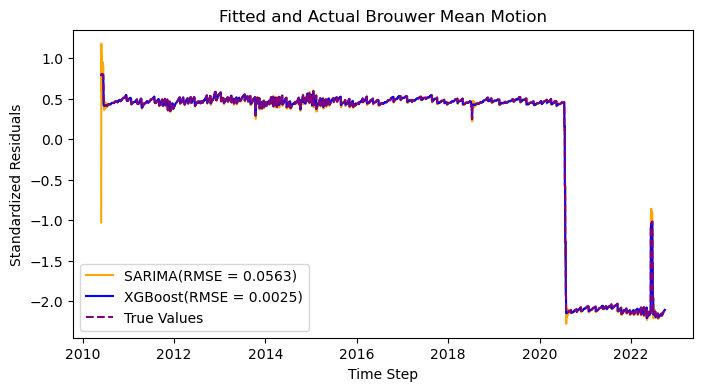

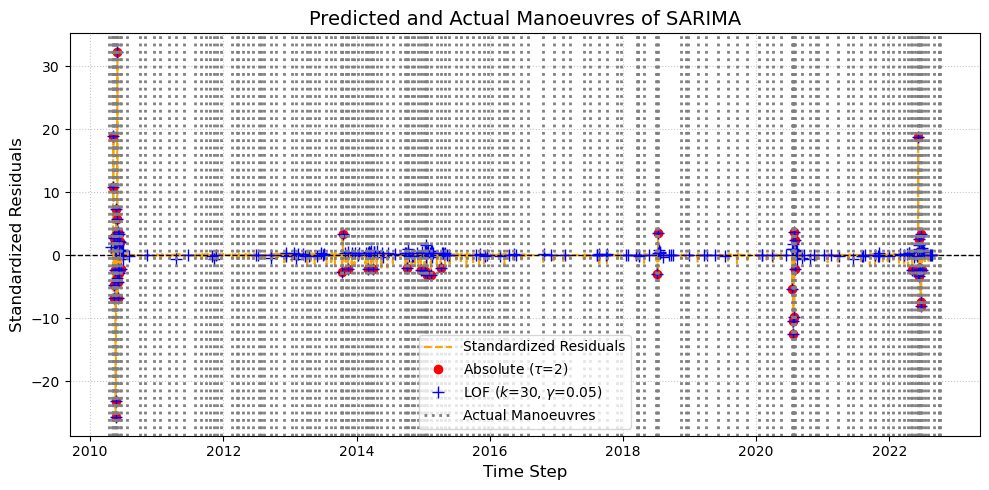

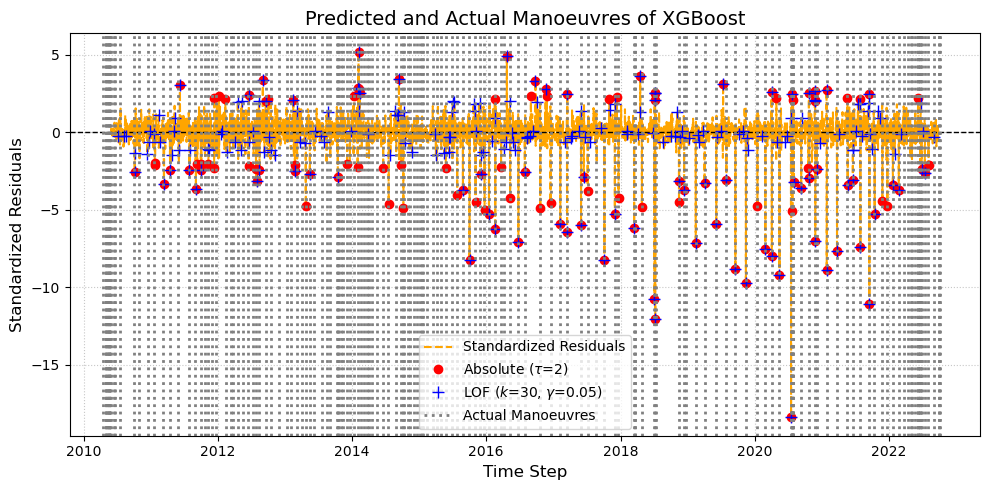

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Baseline of H2A---------------------------------------------------------------------------
Loading dataset HY-2A Ready for training.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-15673.007, Time=3.74 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-14803.734, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-15411.632, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-15178.557, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-14802.665, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-15665.182, Time=1.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-15621.846, Time=1.49 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-15671.864, Time=5.75 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-15674.914, Time=8.39 sec
 ARIMA(1,1,3)(0,0,0

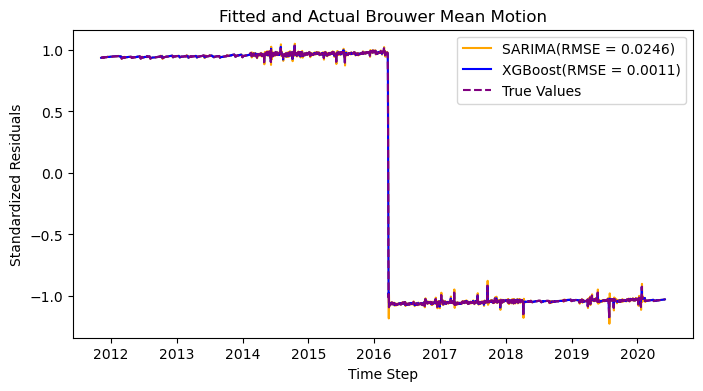

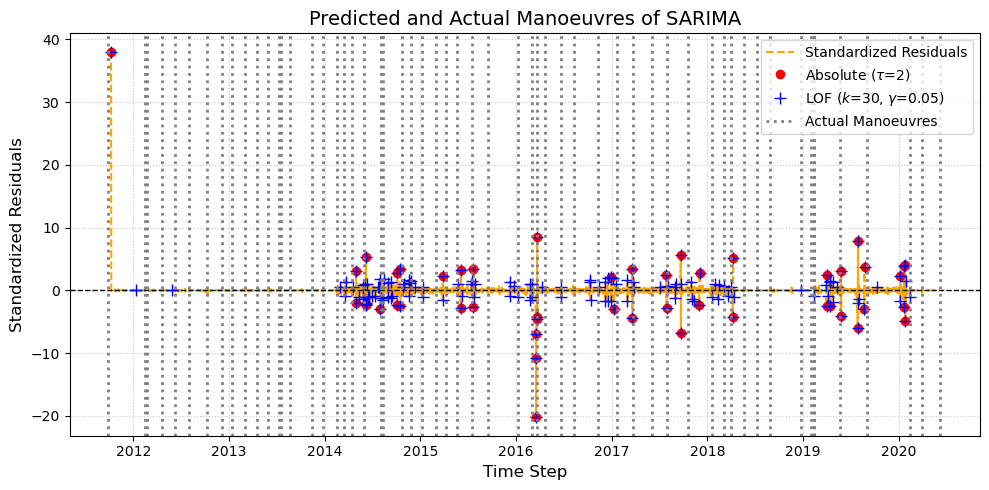

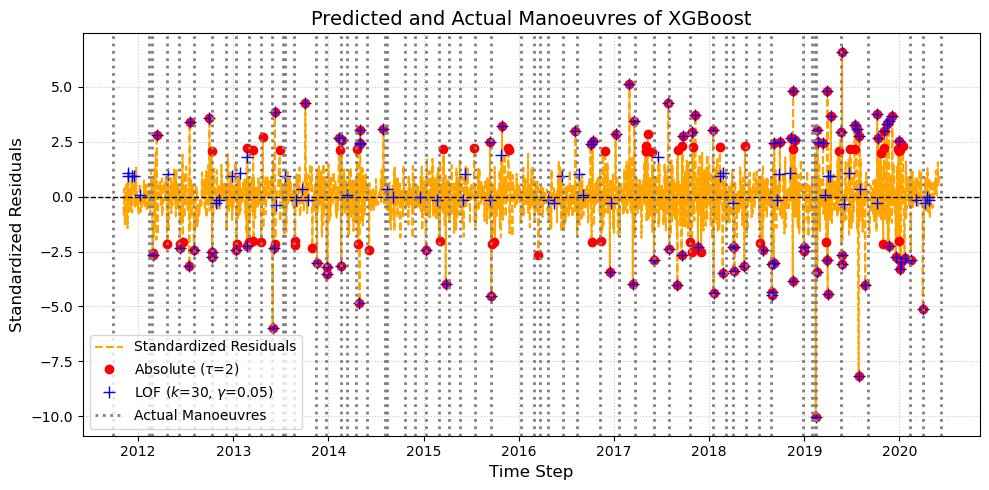

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Baseline of SRL---------------------------------------------------------------------------
Loading dataset SARAL Ready for training.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-6711.872, Time=2.97 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6603.956, Time=0.68 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-6693.527, Time=1.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-6704.785, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6605.274, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-6705.817, Time=6.88 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-6715.257, Time=5.19 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-6714.422, Time=2.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-6704.879, Time=1.80 sec
 ARIMA(3,1,1)(0,0,0)[0] inte

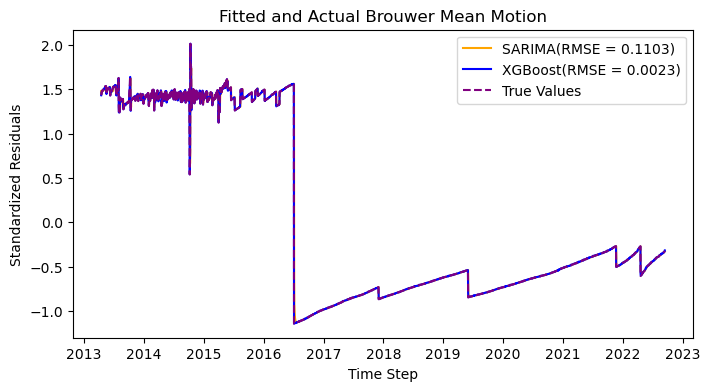

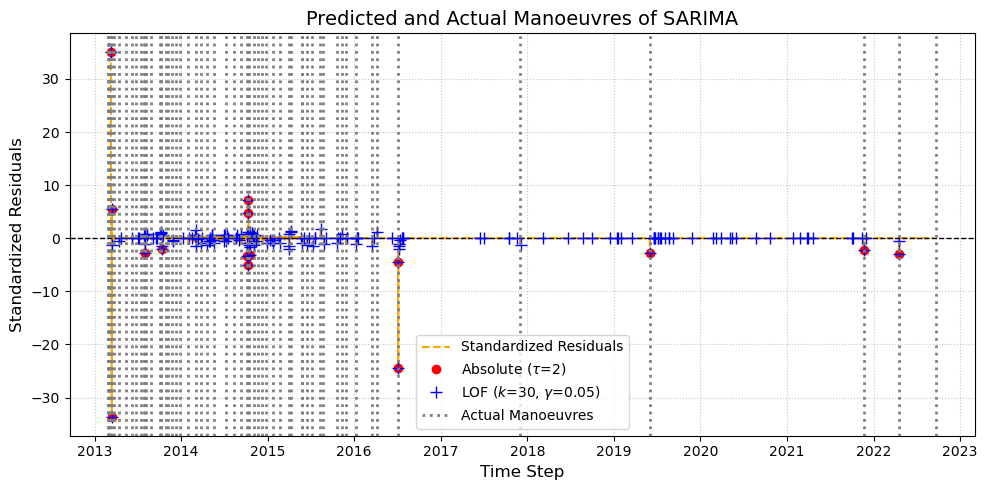

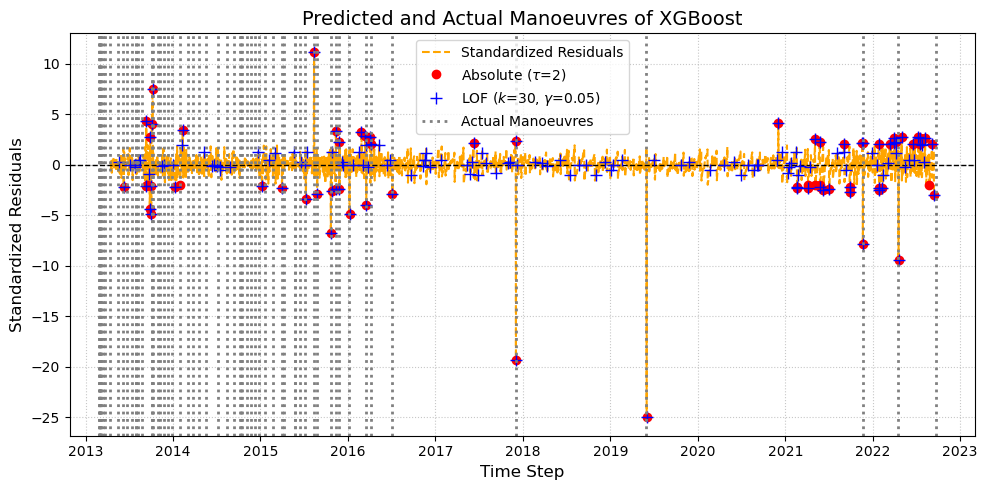

---------------------------------------------------------------------------------------------------------------------------------------------





In [3]:
regular_satellites = {
    "CS2": ("./orbital_elements/CryoSat-2.csv", "./manoeuvres/cs2man.txt"),
    "H2A": ("./orbital_elements/Haiyang-2A.csv", "./manoeuvres/h2aman.txt"),
    "SRL": ("./orbital_elements/SARAL.csv", "./manoeuvres/srlman.txt")
}

satellites = {}

for sate, path in regular_satellites.items():
    print(f"------------------------------------------------Baseline of {sate}---------------------------------------------------------------------------")
    satellite = Satellite(path[0], path[1], eda_show=False)
    SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = anomaly_detect(satellite, SARIMA_decomp = False, XGB_decomp = False, n_lag=30, 
                                                                           SARIMA_threshold=2, XGBoost_threshold=2, 
                                                                           n_neighbors=30, contamination=0.05)
    satellites.setdefault(satellite.name, []).extend([satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse])
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

# Hyperparamters Tuning

In [4]:
def hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = True, 
                   n_lag = 30, SARIMA_threshold=2, XGBoost_threshold=2, n_neighbors=30, contamination=0.05):
    # Fit XGBoost
    _, XGB_true, XGB_fit = train_XGB(satellite, n_lag)
    XGB_residual = get_residual(XGB_true, XGB_fit, residual_decomposed = XGB_decomp, plt_show=False)

    # Calculate RMSE
    XGB_rmse = round(np.sqrt(mean_squared_error(XGB_true, XGB_fit)),4)

    # Match the index for plots
    common_index = XGB_fit.index.intersection(SARIMA_fit.index)
    SARIMA_fit = SARIMA_fit.reindex(common_index)

    # # Draw a Q-Q plot of the residuals
    # stats.probplot(residuals, dist="norm", plot=plt)
    # plt.title("QQ Plot of Residuals")
    # plt.xlabel("Theoretical Quantiles")
    # plt.ylabel("Sample Quantiles")
    # plt.grid(True)
    # plt.show()
    
    # Plot the Fitted Brouwer mean motion
    plt.figure(figsize=(8, 4))
    plt.plot(SARIMA_fit, label=f"SARIMA(RMSE = {SARIMA_rmse})", color='orange', linestyle='solid')
    plt.plot(XGB_fit, label=f"XGBoost(RMSE = {XGB_rmse})", color='blue', linestyle='solid')
    plt.plot(XGB_true, label="True Values", color='purple', linestyle='dashed')
    
    plt.title(f"Fitted and Actual Brouwer Mean Motion")
    plt.xlabel("Time Step")
    plt.ylabel("Scaled Brouwer Mean Motion")
    plt.ylabel("Standardized Residuals")
    plt.legend()
    plt.show() 

    # Detect the outliers
    SARIMA_abs_stdres, SARIMA_abs_pred_man = outlier_absolute(SARIMA_residual, SARIMA_threshold)
    _, SARIMA_LOF_pred_man = outlier_LOF(SARIMA_residual, n_neighbors, contamination)
    # Plot the results
    plot_anomaly_res("SARIMA", SARIMA_abs_stdres, SARIMA_abs_pred_man, SARIMA_LOF_pred_man, SARIMA_threshold, n_neighbors, contamination)
    
    XGB_abs_stdres, XGB_abs_pred_man = outlier_absolute(XGB_residual, XGBoost_threshold)
    _, XGB_LOF_pred_man = outlier_LOF(XGB_residual, n_neighbors, contamination)
    # Plot the results
    plot_anomaly_res("XGBoost", XGB_abs_stdres, XGB_abs_pred_man, XGB_LOF_pred_man, XGBoost_threshold, n_neighbors, contamination)

In [5]:
satellites.keys()

dict_keys(['CRYO2', 'HY-2A', 'SARAL'])

# SEN3A
1. ARIMA(1,0,3)(0,0,0)[0] AIC: 2279.768

# Threshold选择

SARIMA：threshold = 1， XGBoost = 1

------------------------------------------------Results of threshold = 1---------------------------------------------------------------------------


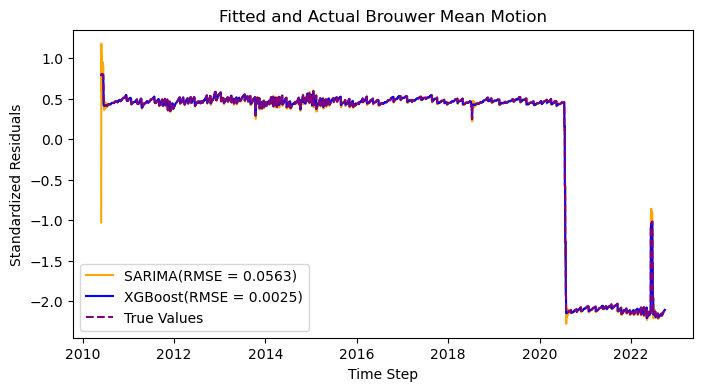

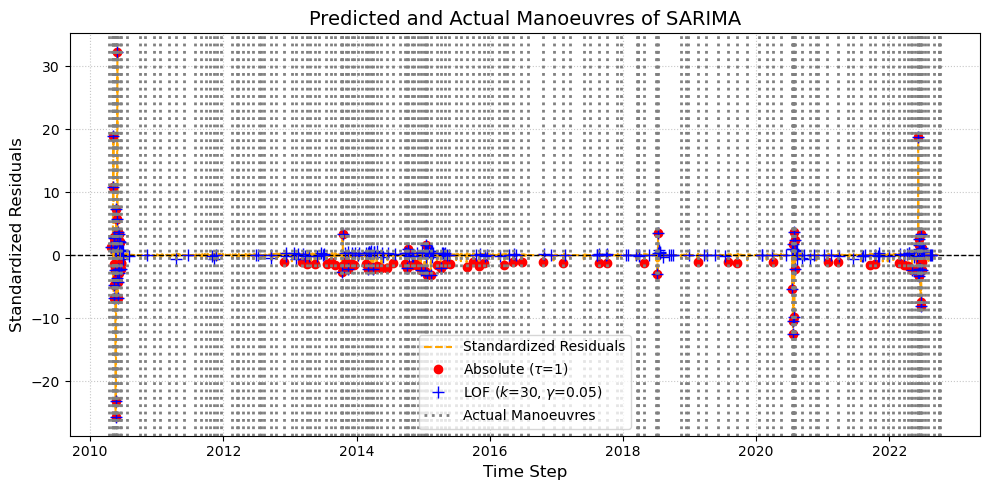

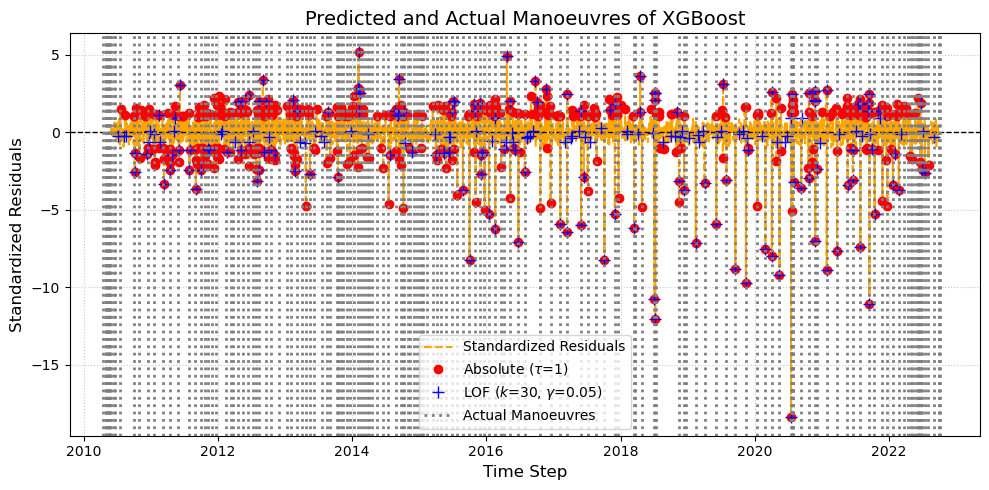

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 1.5---------------------------------------------------------------------------


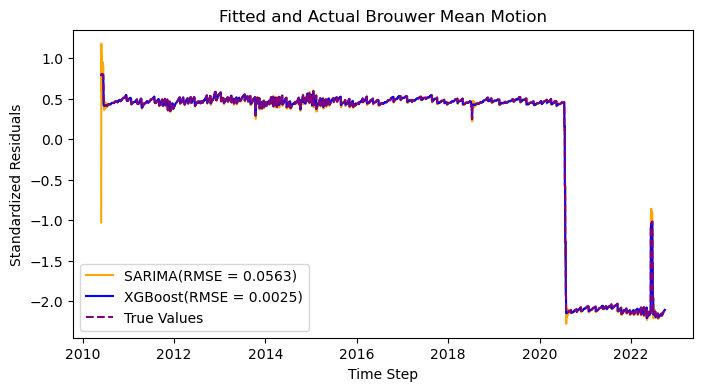

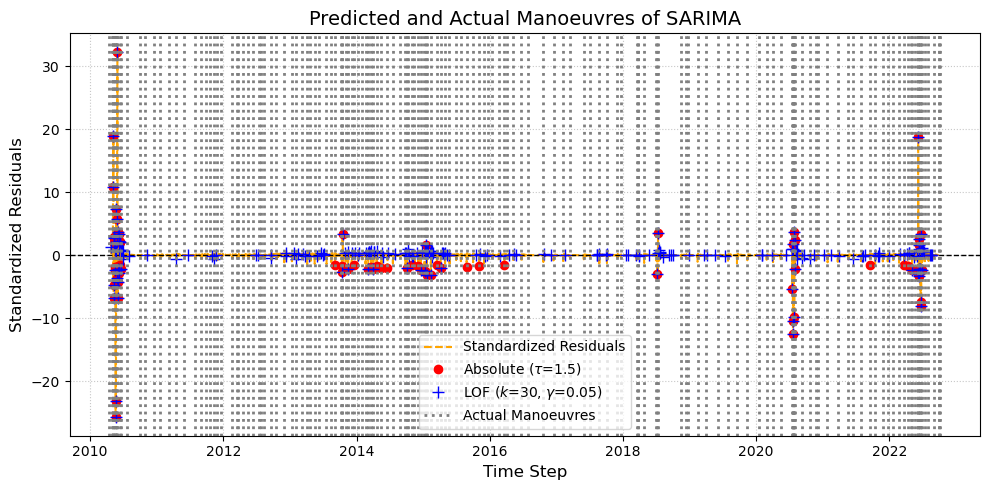

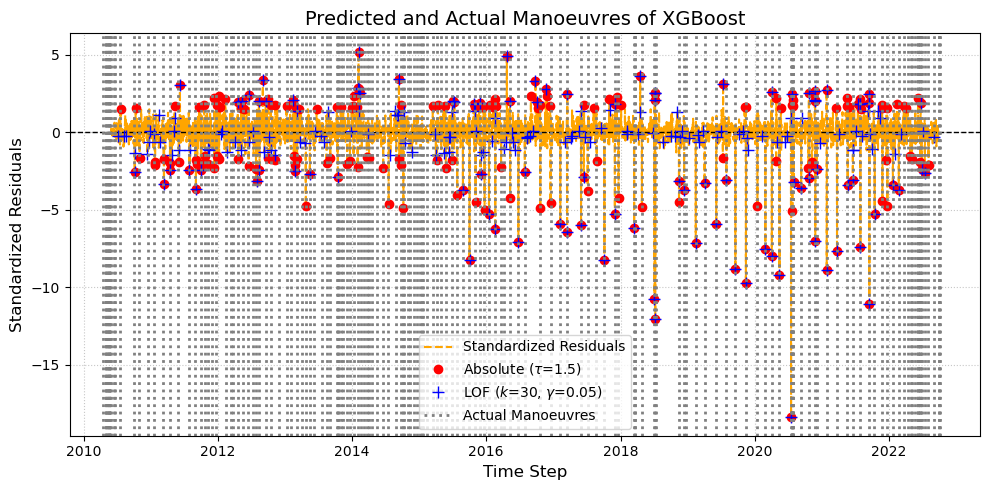

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 2---------------------------------------------------------------------------


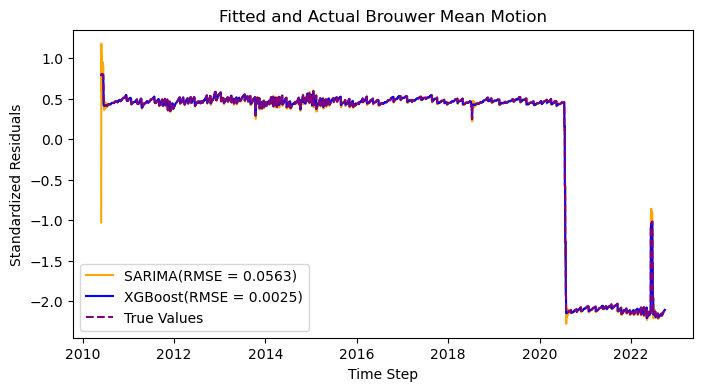

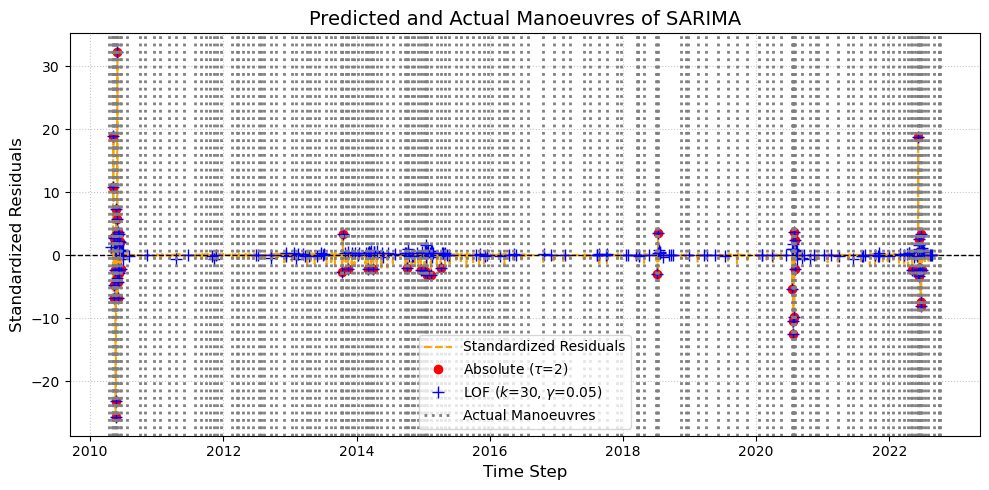

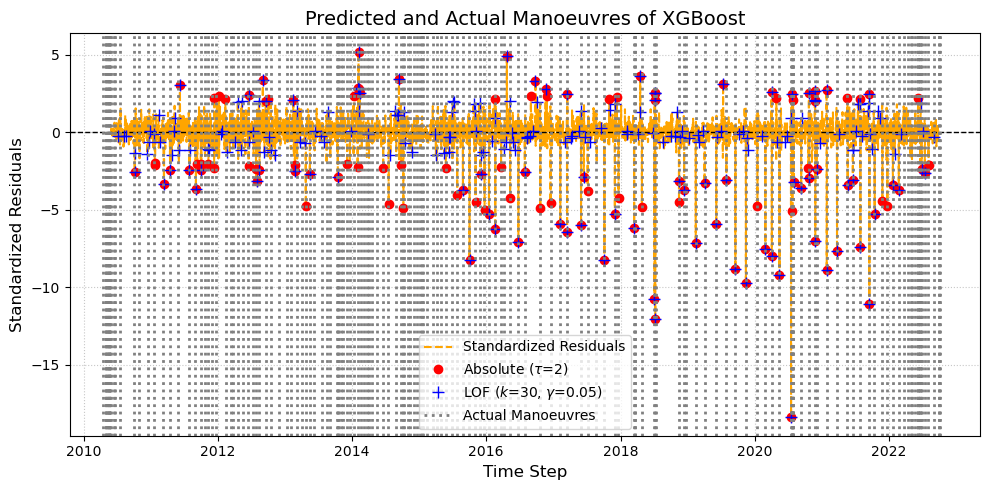

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 2.5---------------------------------------------------------------------------


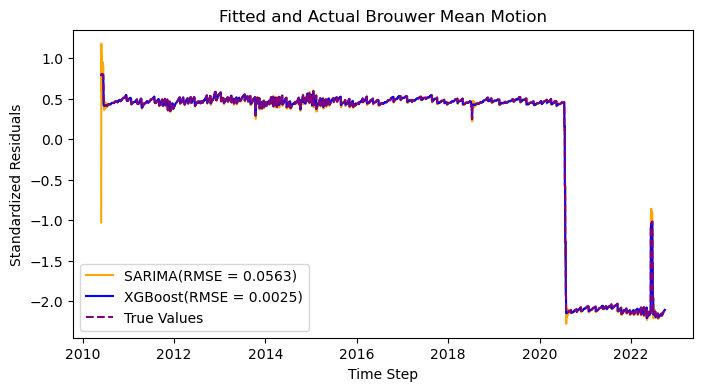

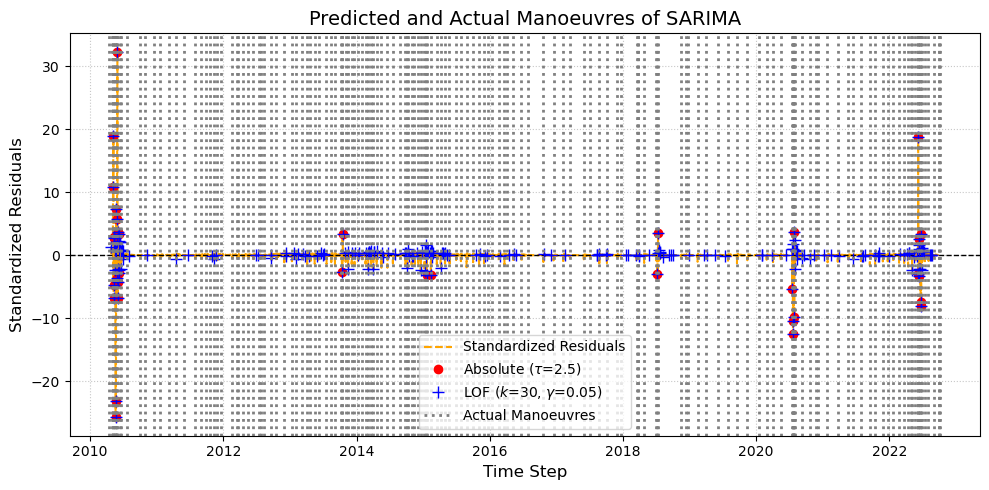

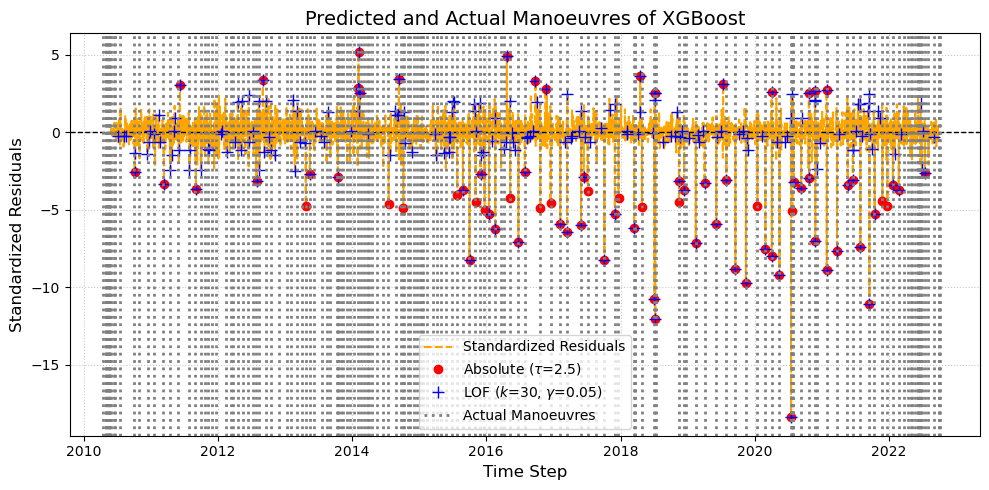

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 3---------------------------------------------------------------------------


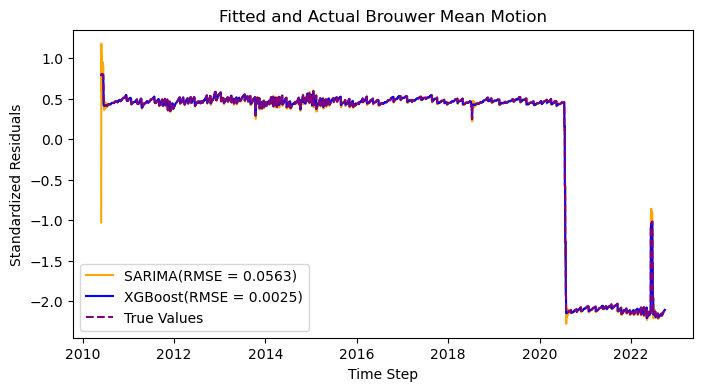

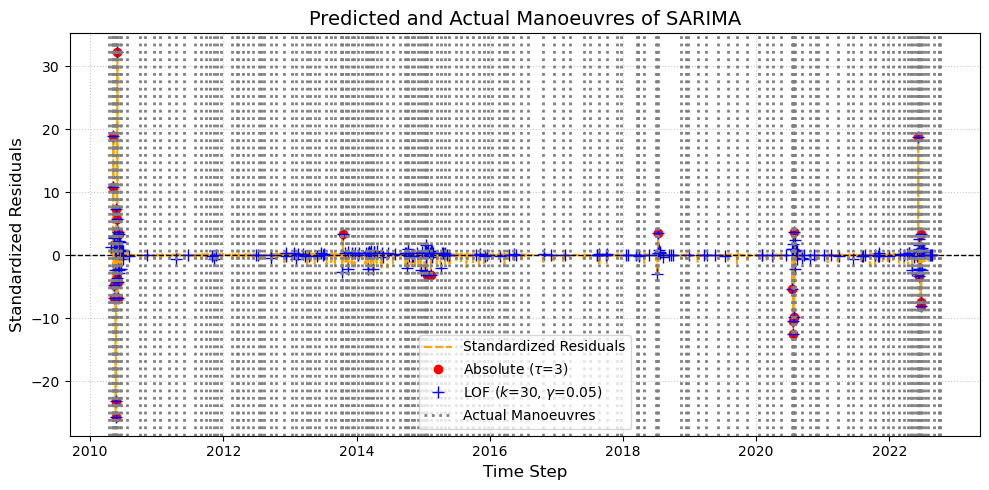

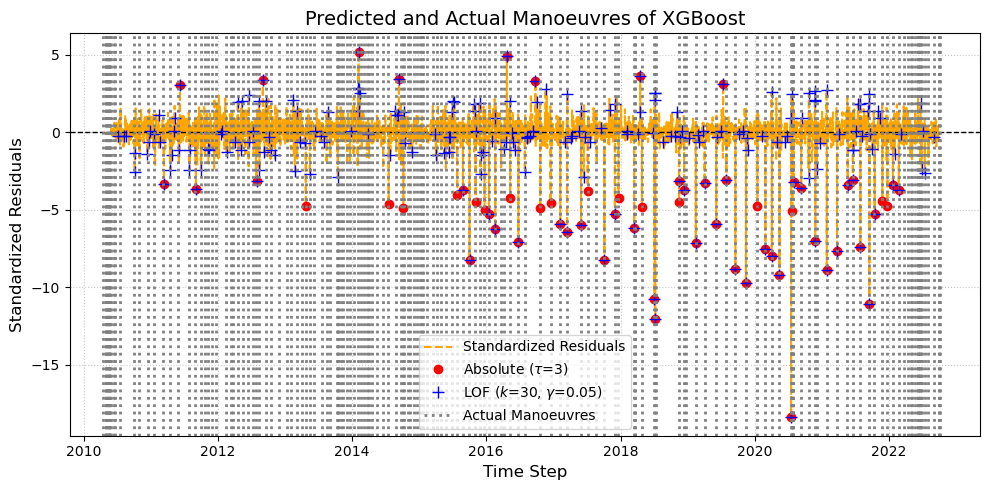

---------------------------------------------------------------------------------------------------------------------------------------------





In [6]:
# Threshold
grids = [1, 1.5, 2, 2.5, 3]
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['CRYO2']
for i in grids:
    print(f"------------------------------------------------Results of threshold = {i}---------------------------------------------------------------------------")
    hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, SARIMA_threshold=i, XGBoost_threshold=i, n_neighbors=30, contamination=0.05)
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

CRYO2 SARIAM: threshold = 1, XGboost: threshold = 1.5

------------------------------------------------Results of threshold = 1---------------------------------------------------------------------------


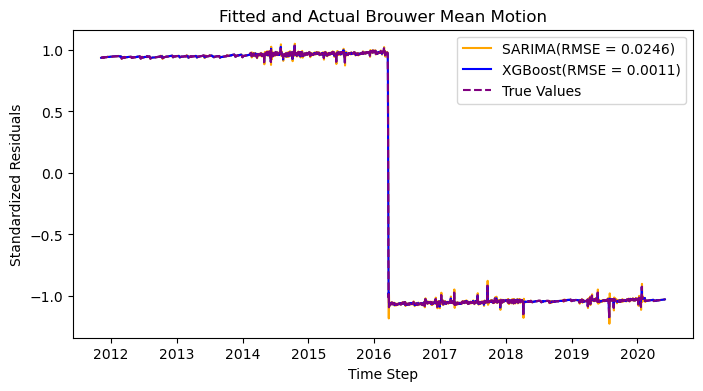

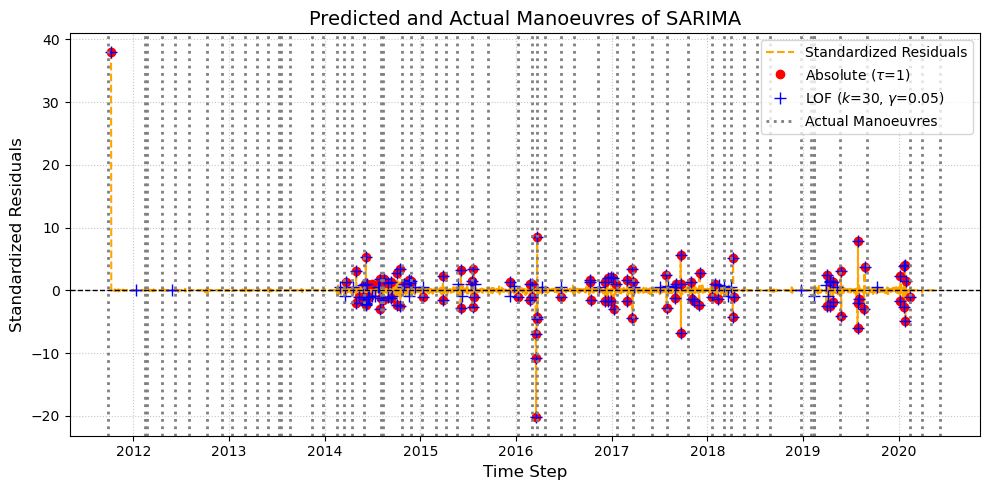

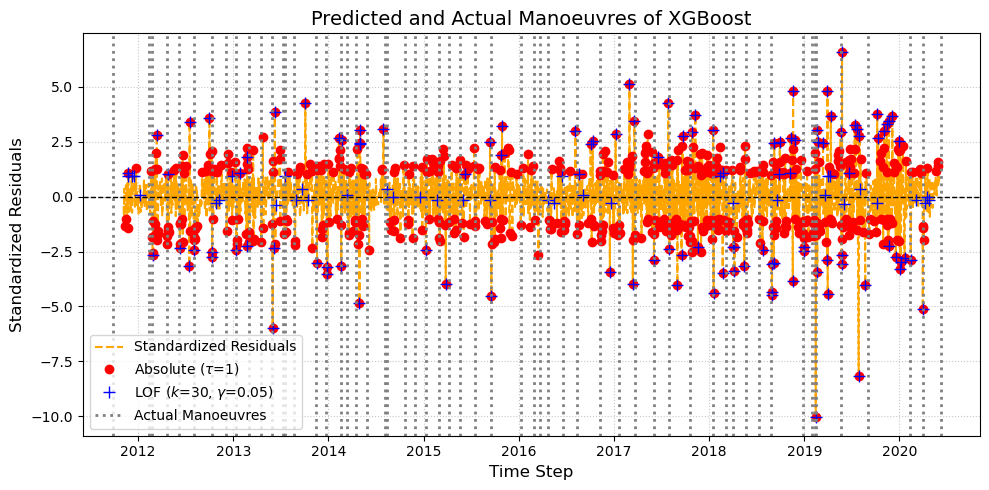

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 1.5---------------------------------------------------------------------------


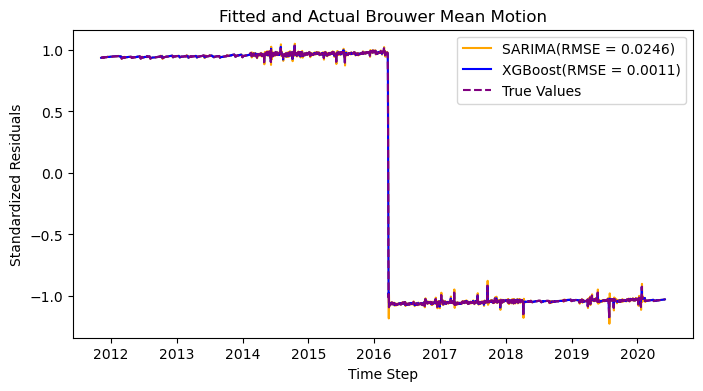

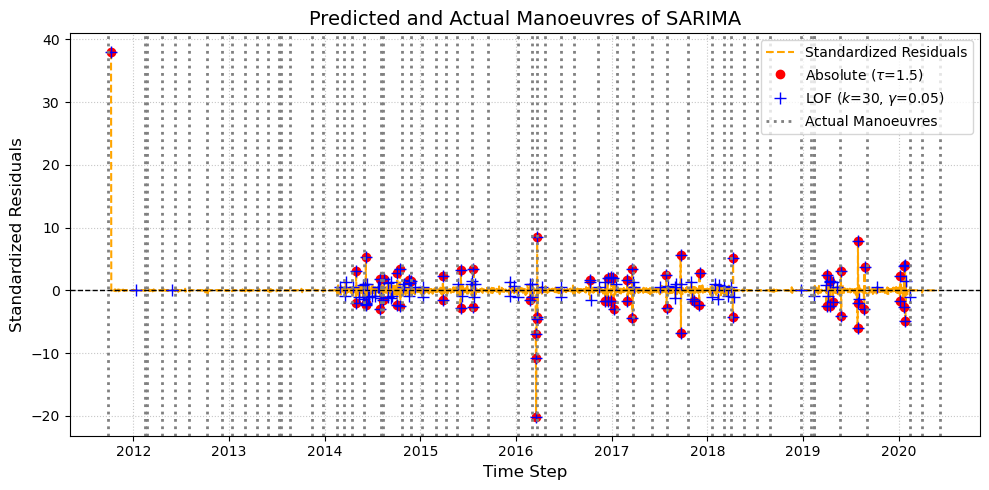

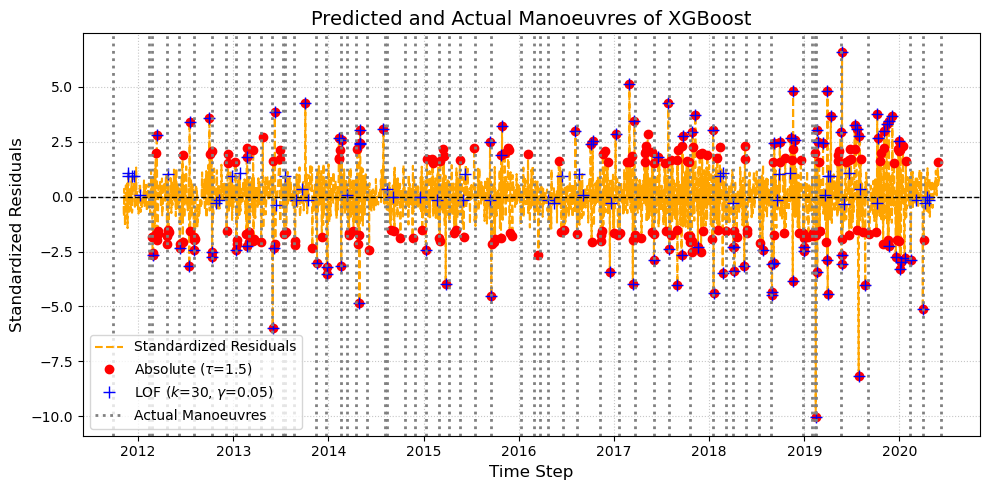

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 2---------------------------------------------------------------------------


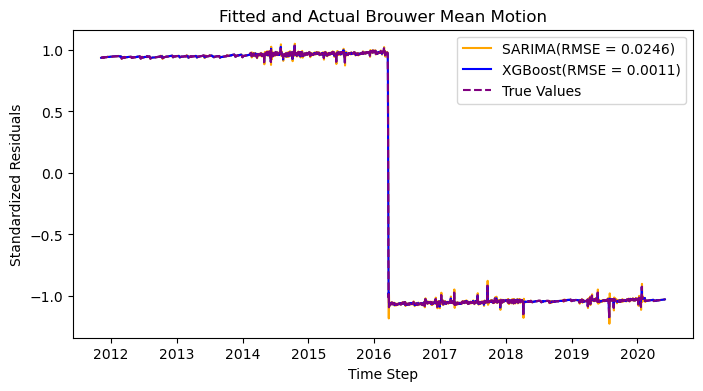

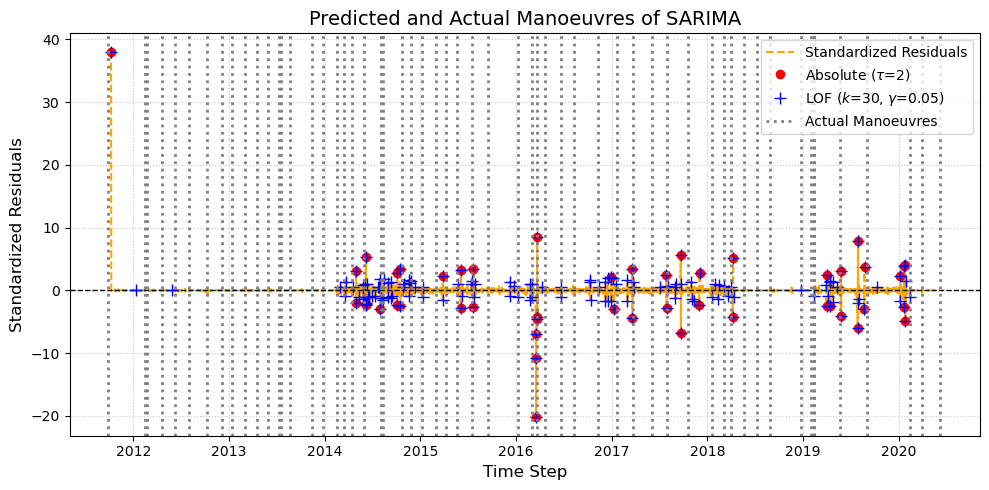

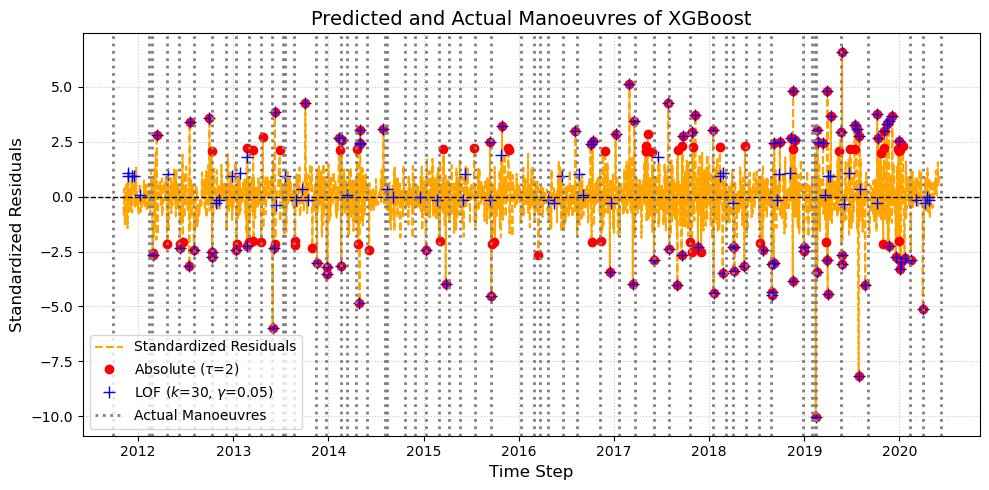

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 2.5---------------------------------------------------------------------------


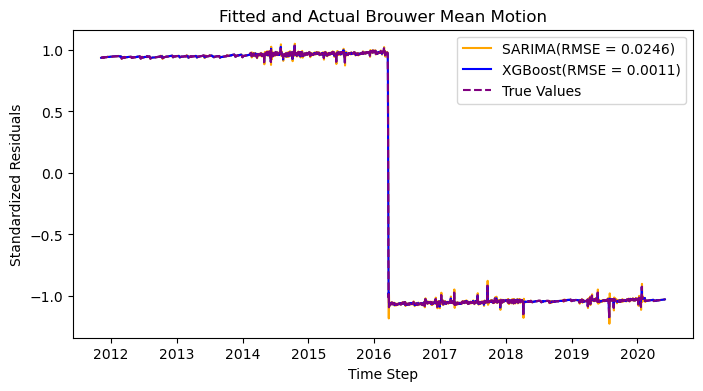

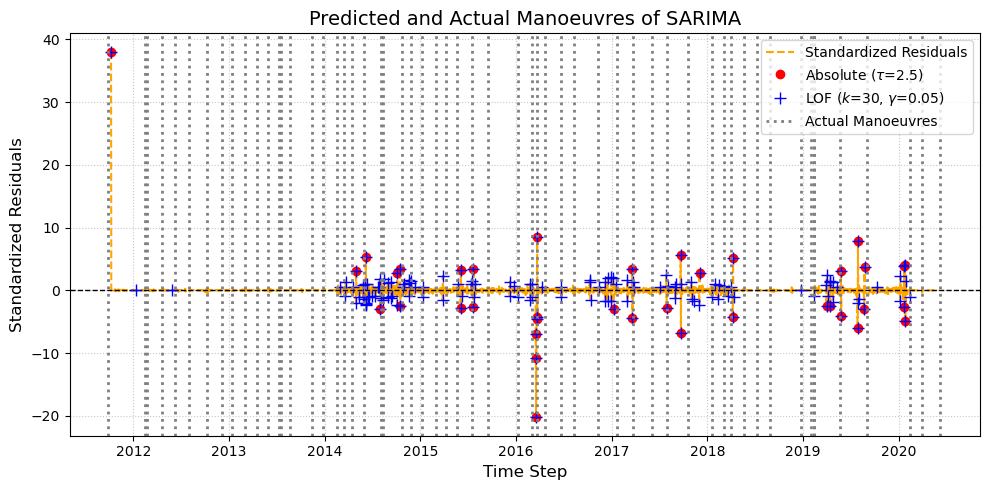

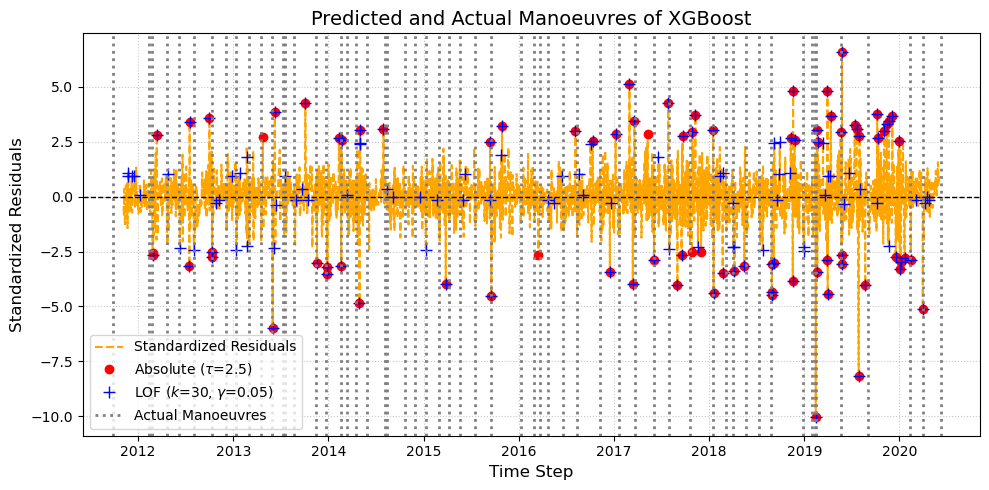

---------------------------------------------------------------------------------------------------------------------------------------------





In [7]:
# Threshold
grids = [1, 1.5, 2, 2.5]
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['HY-2A']
for i in grids:
    print(f"------------------------------------------------Results of threshold = {i}---------------------------------------------------------------------------")
    hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, SARIMA_threshold=i, XGBoost_threshold=i, n_neighbors=30, contamination=0.05)
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

HY-2A SARIAM: threshold = 1, XGboost: threshold = 1.5

------------------------------------------------Results of threshold = 1---------------------------------------------------------------------------


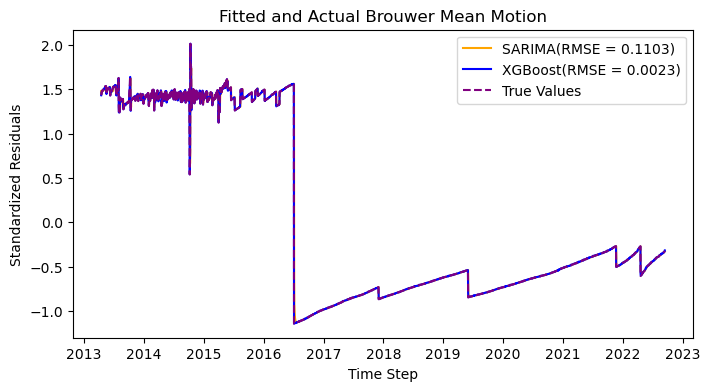

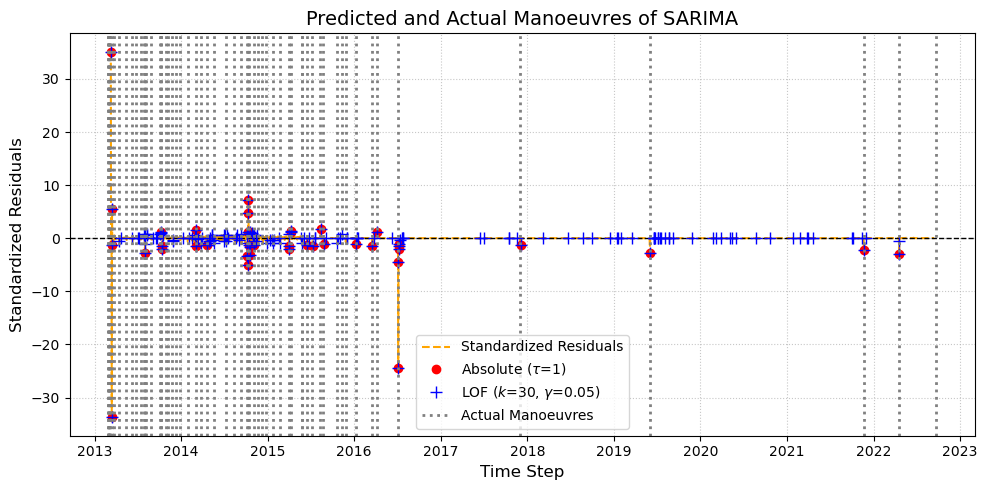

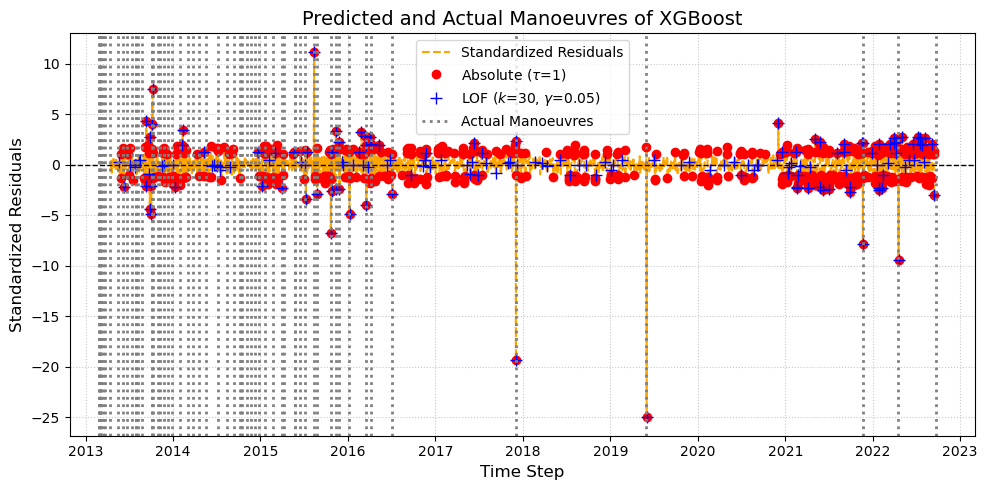

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 1.5---------------------------------------------------------------------------


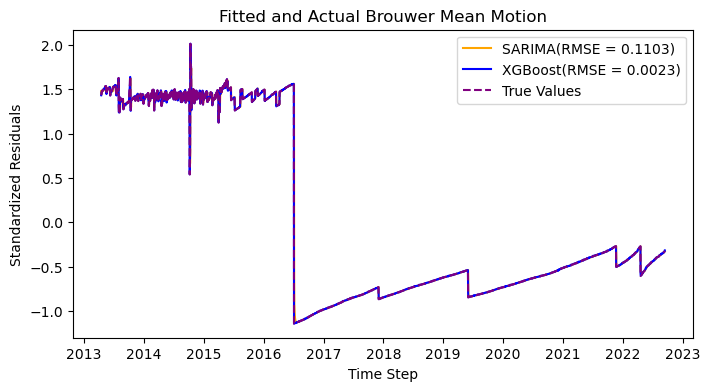

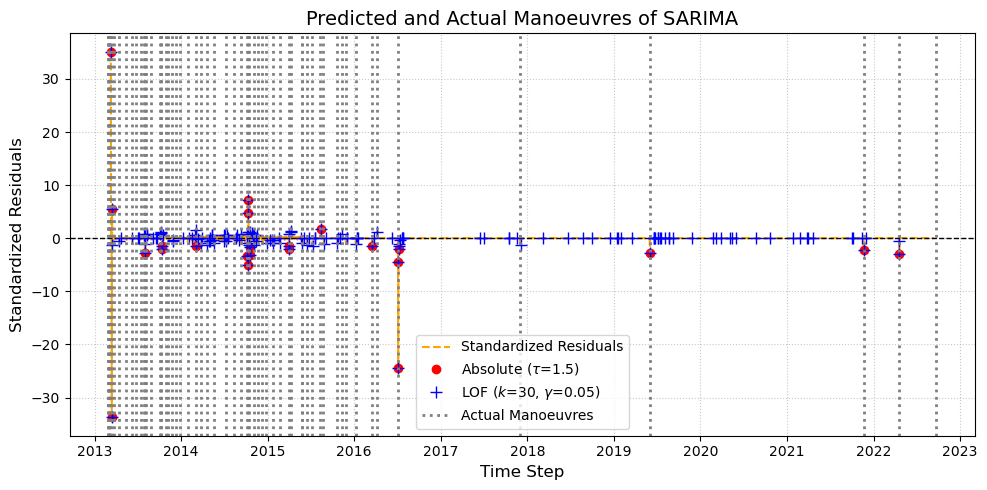

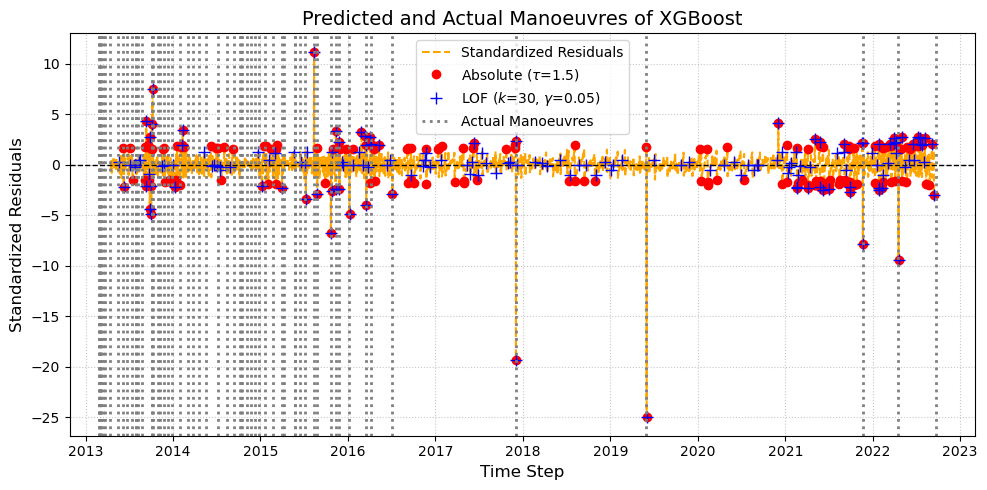

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 2---------------------------------------------------------------------------


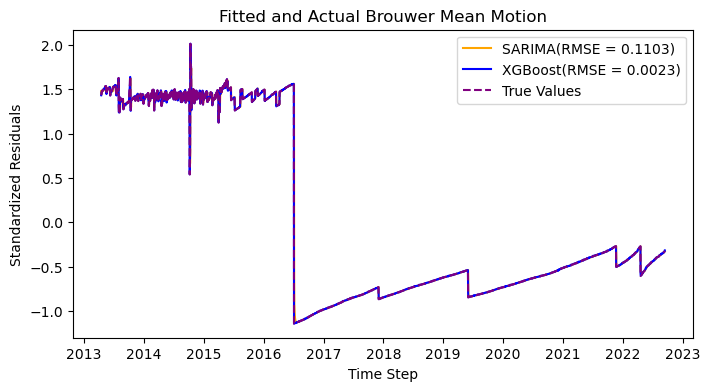

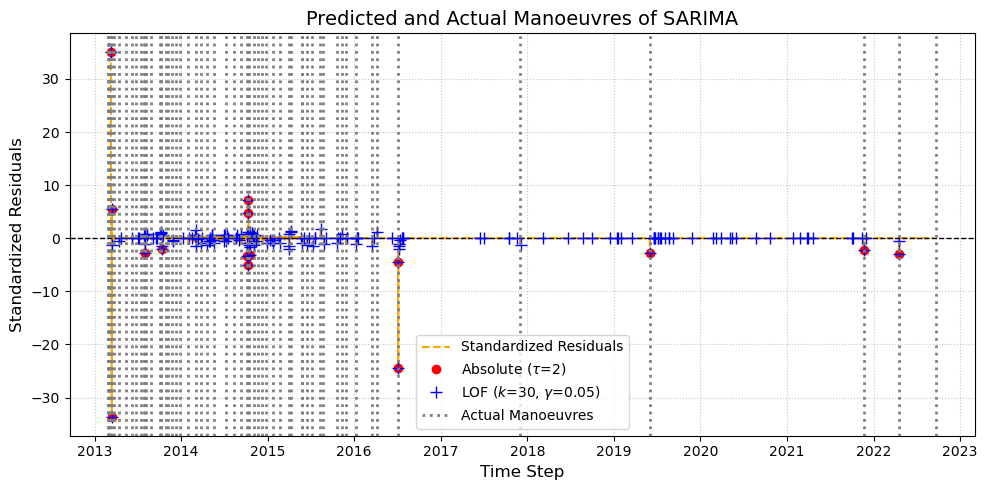

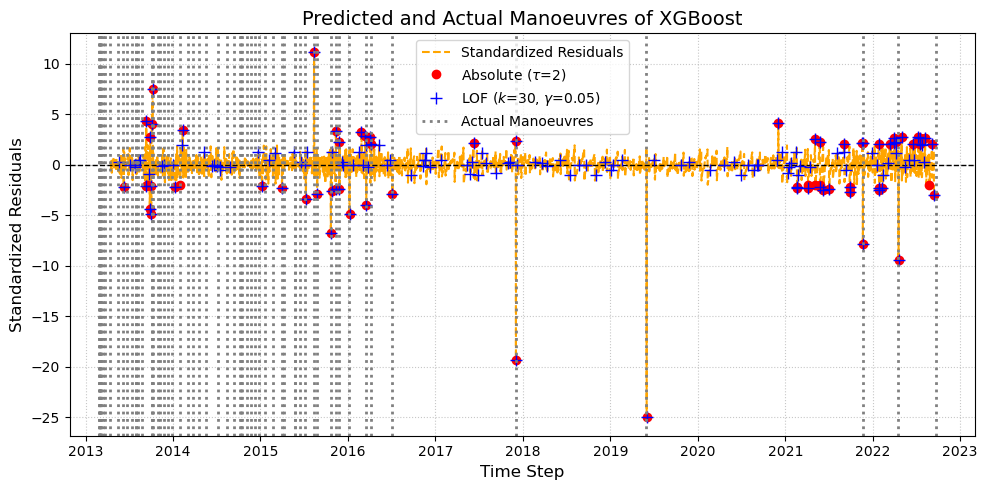

---------------------------------------------------------------------------------------------------------------------------------------------



------------------------------------------------Results of threshold = 2.5---------------------------------------------------------------------------


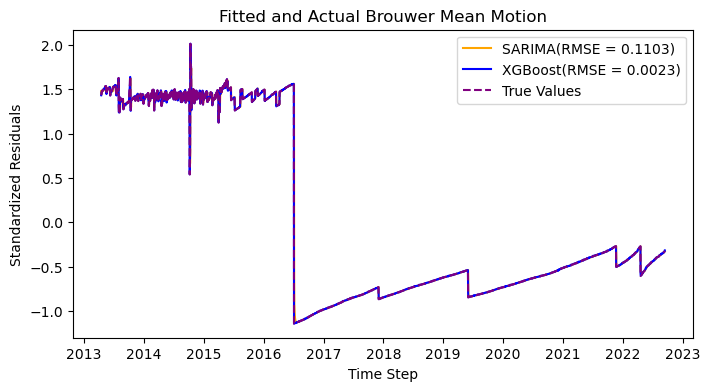

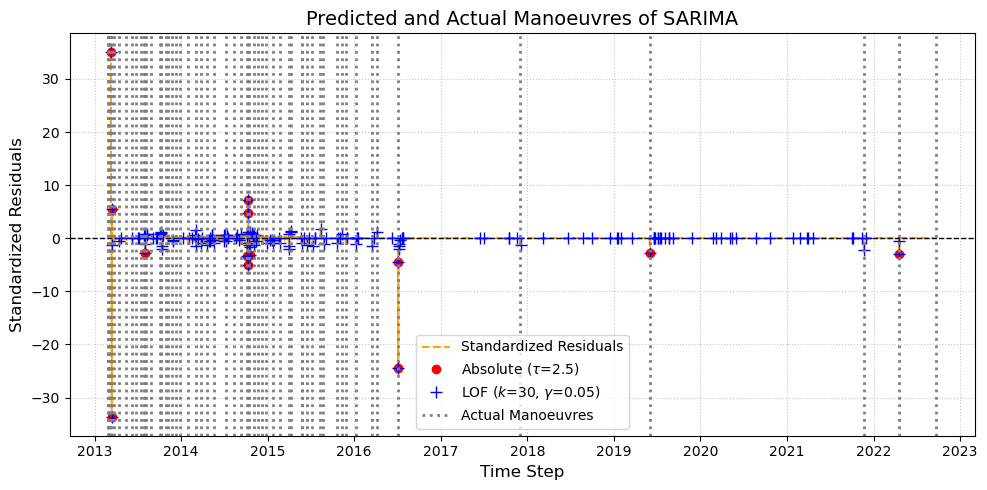

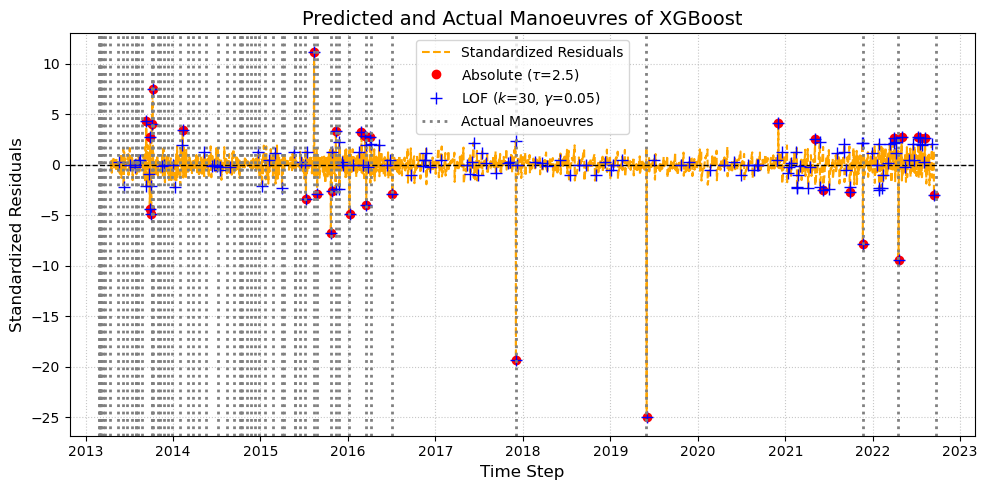

---------------------------------------------------------------------------------------------------------------------------------------------





In [8]:
# Threshold
grids = [1, 1.5, 2, 2.5]
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['SARAL']
for i in grids:
    print(f"------------------------------------------------Results of threshold = {i}---------------------------------------------------------------------------")
    hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, SARIMA_threshold=i, XGBoost_threshold=i, n_neighbors=30, contamination=0.05)
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

SARAL SARIAM: threshold = 1, XGboost: threshold = 1.5 前，2 后

# LOF hyper tuning

In [9]:
# Grid search parameters
k_list = [20, 30, 50]
gamma_list = [0.01, 0.03, 0.05]

grid = [(k, gamma) for k in k_list for gamma in gamma_list]

print(grid)

[(20, 0.01), (20, 0.03), (20, 0.05), (30, 0.01), (30, 0.03), (30, 0.05), (50, 0.01), (50, 0.03), (50, 0.05)]


-------------------------------------------------------------------------------------------------------------------------------------------


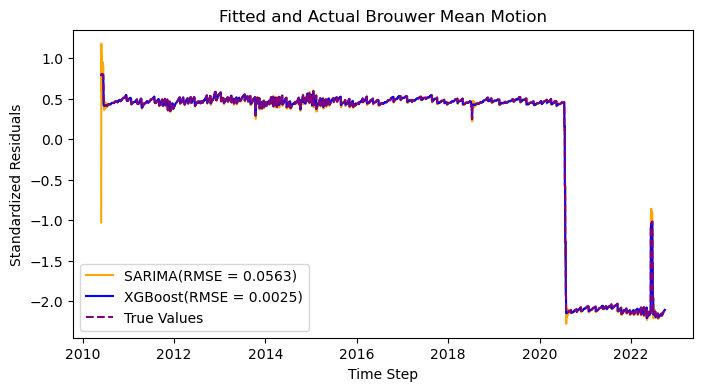

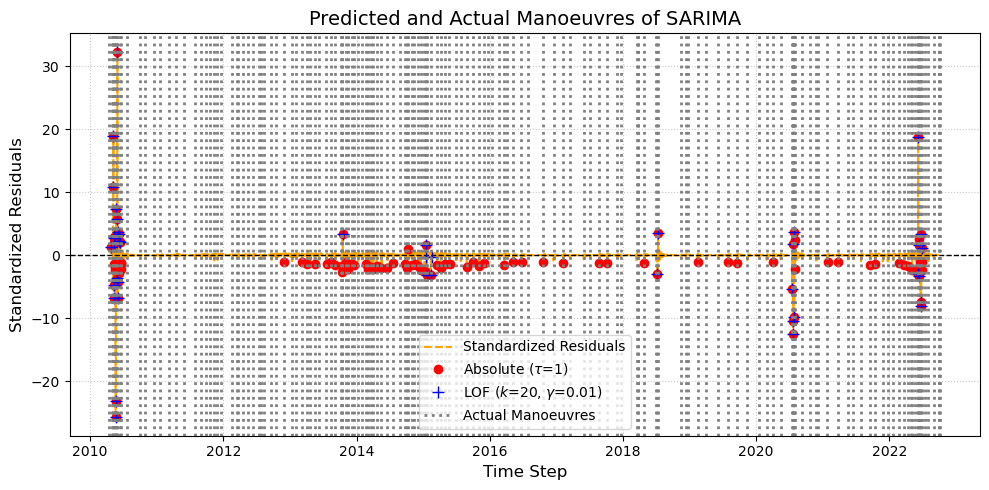

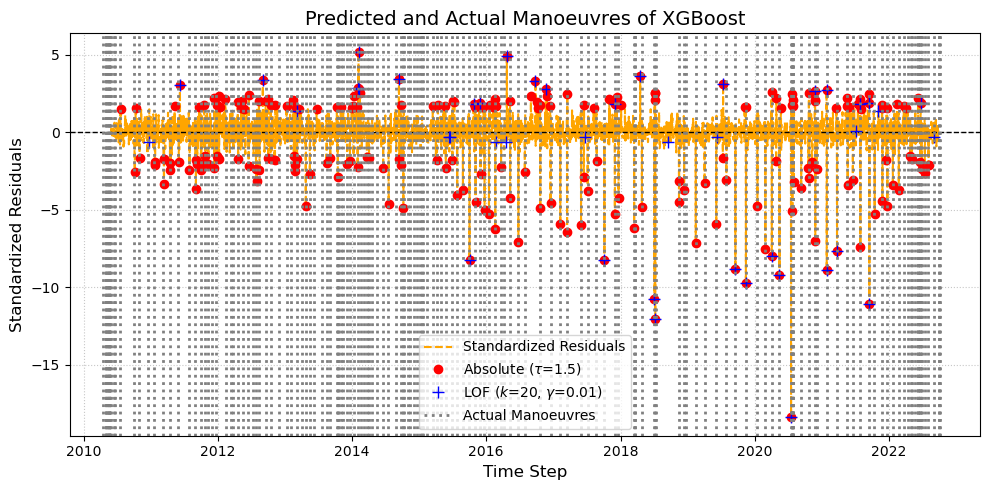

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


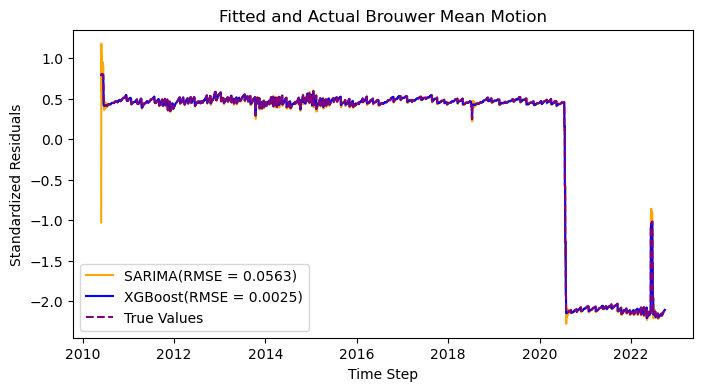

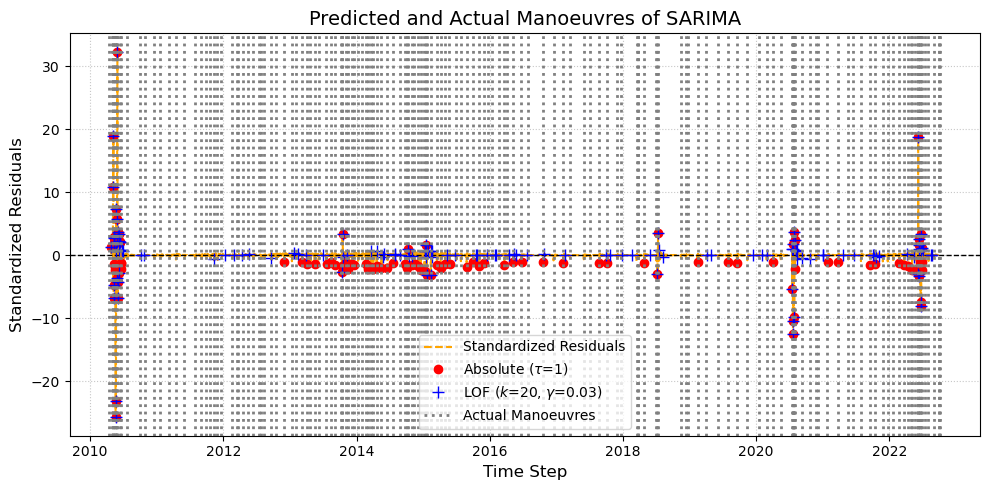

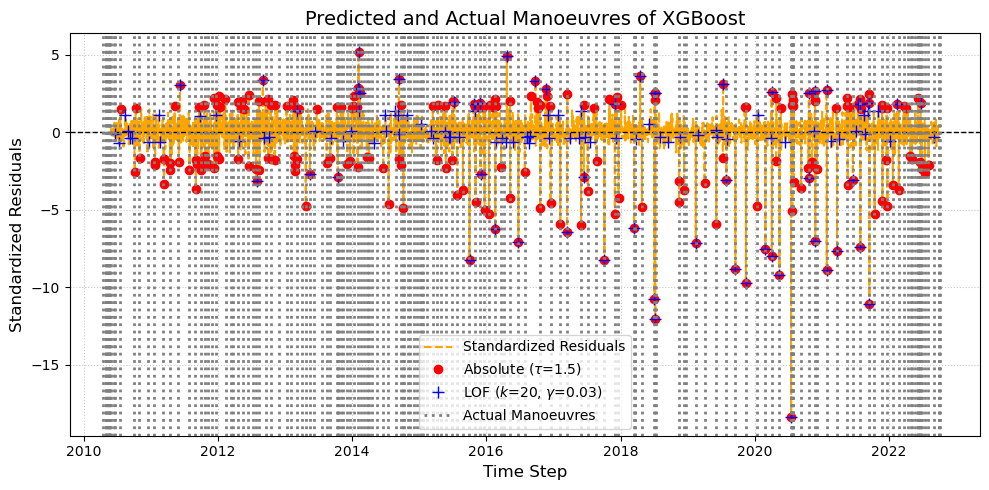

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


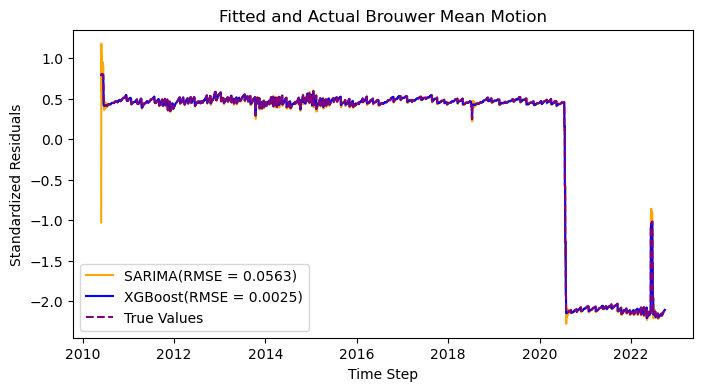

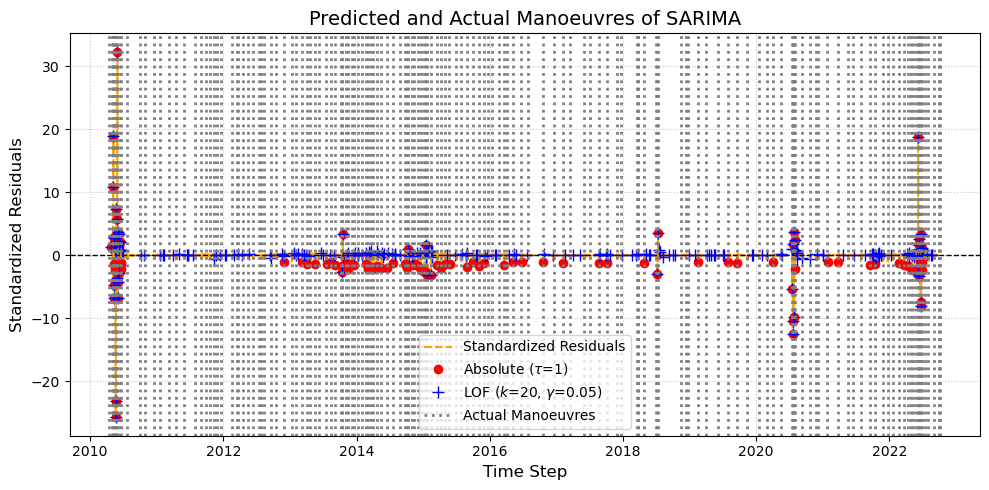

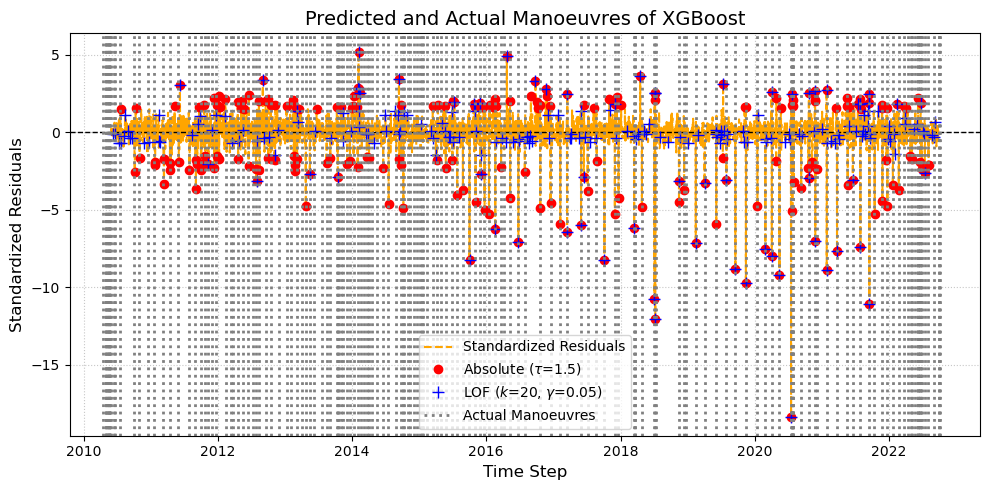

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


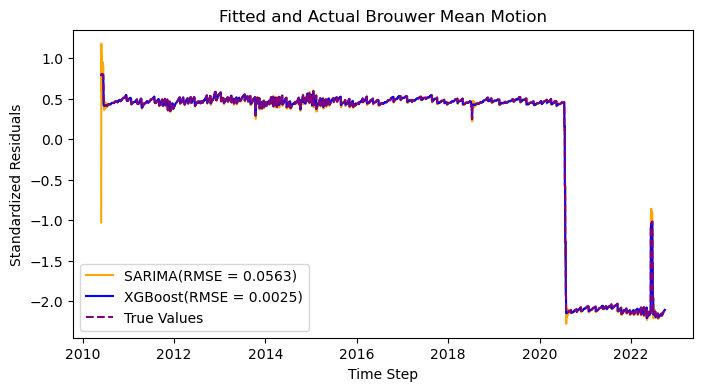

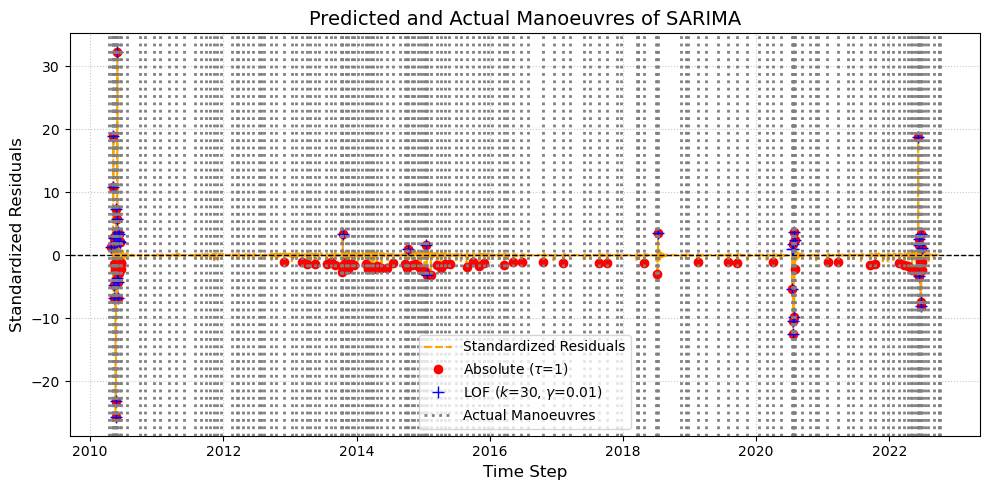

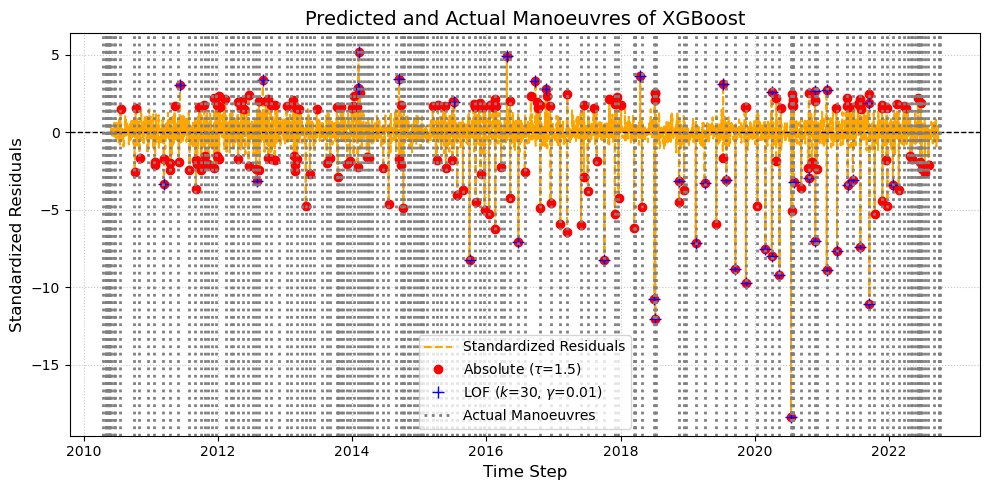

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


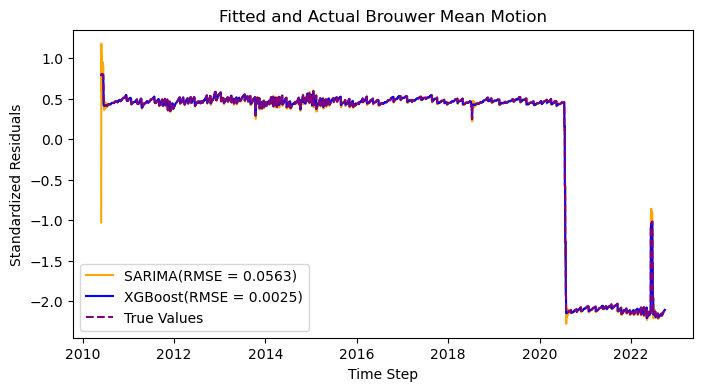

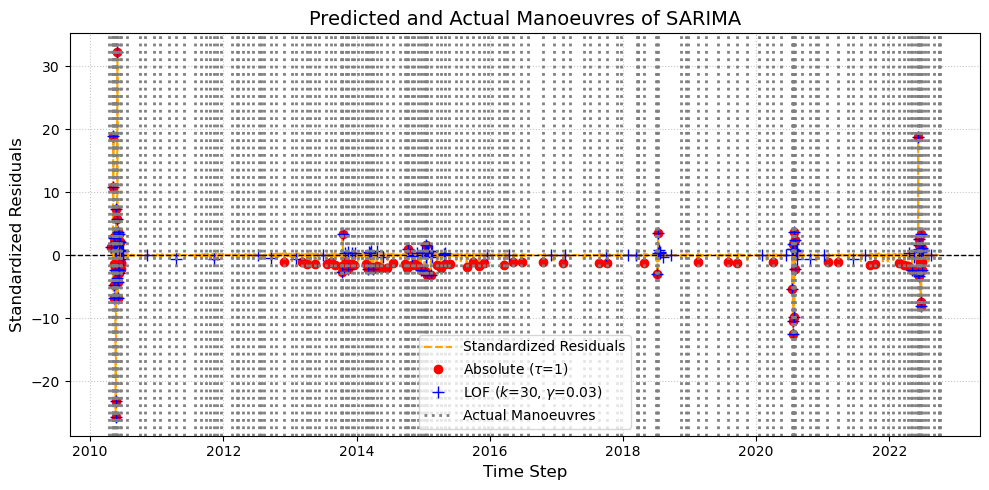

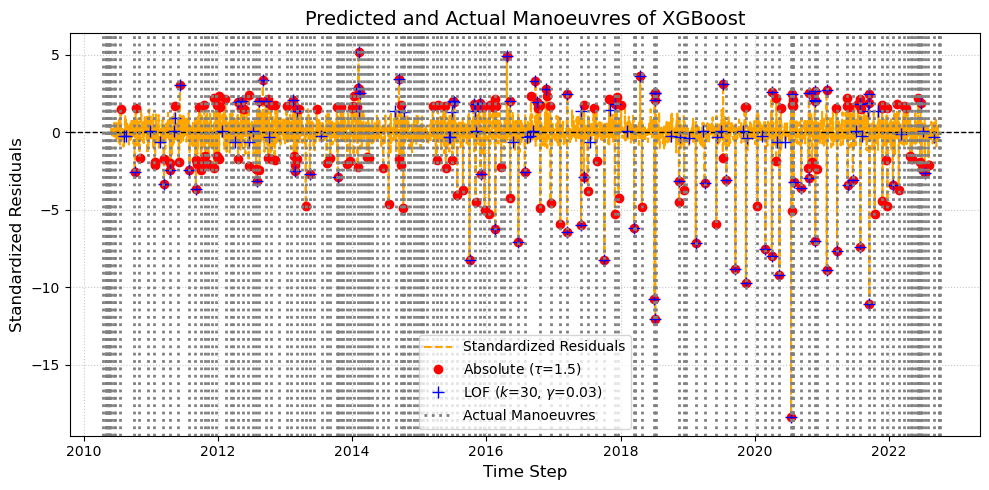

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


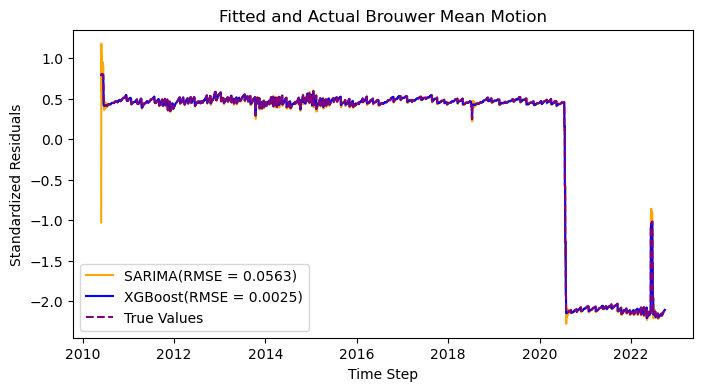

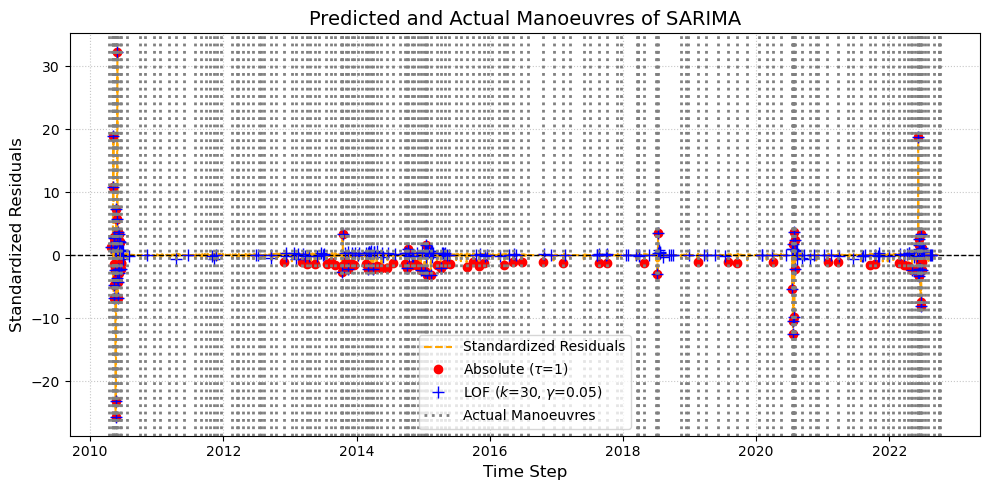

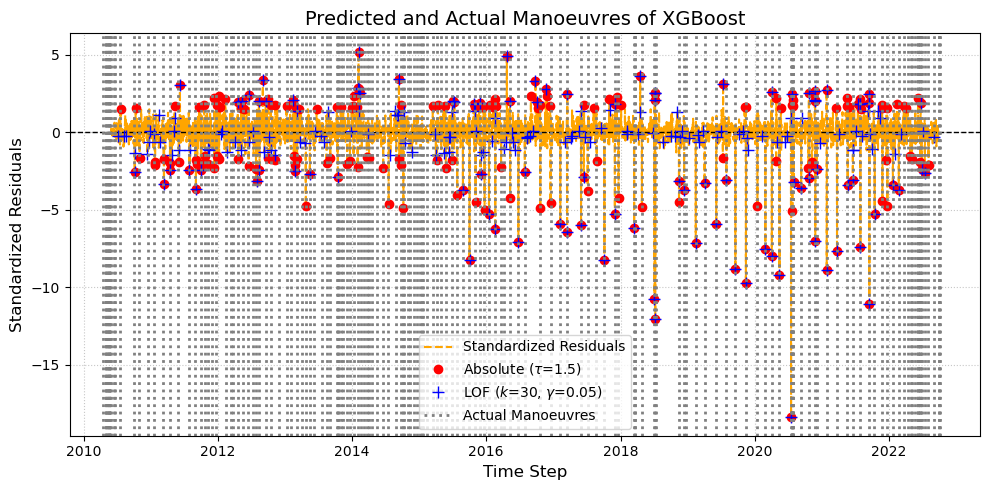

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


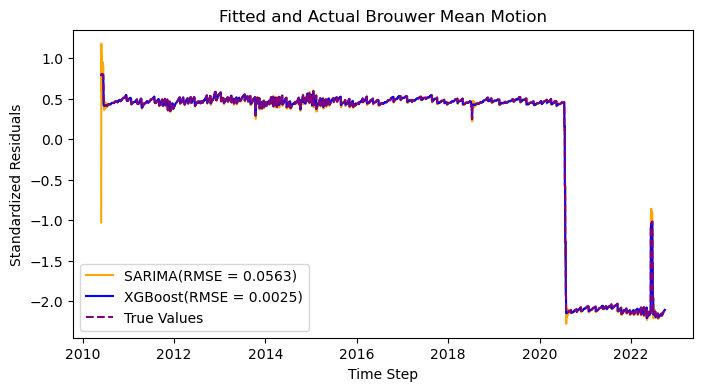

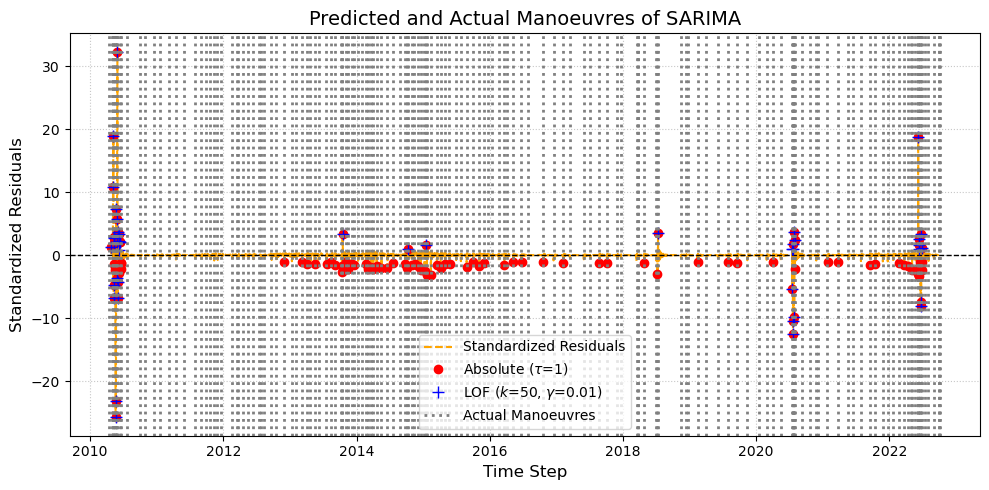

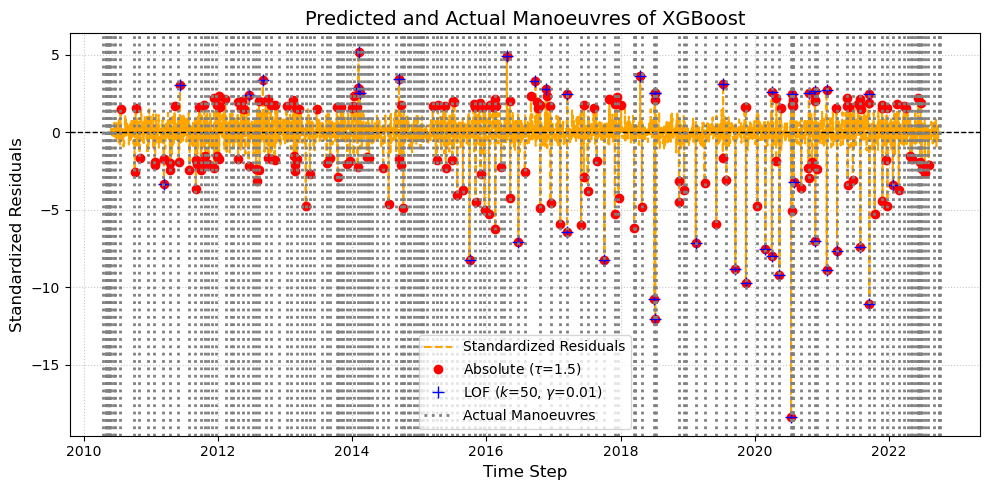

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


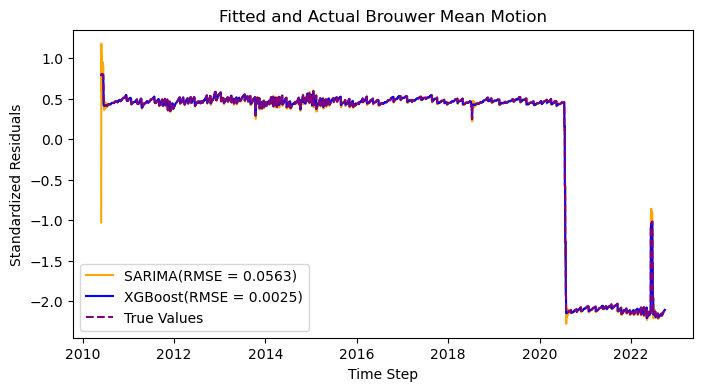

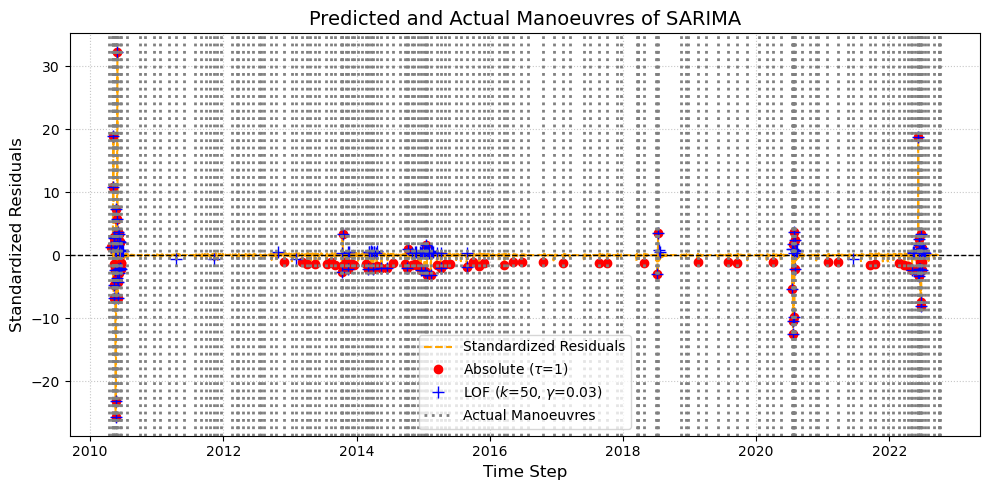

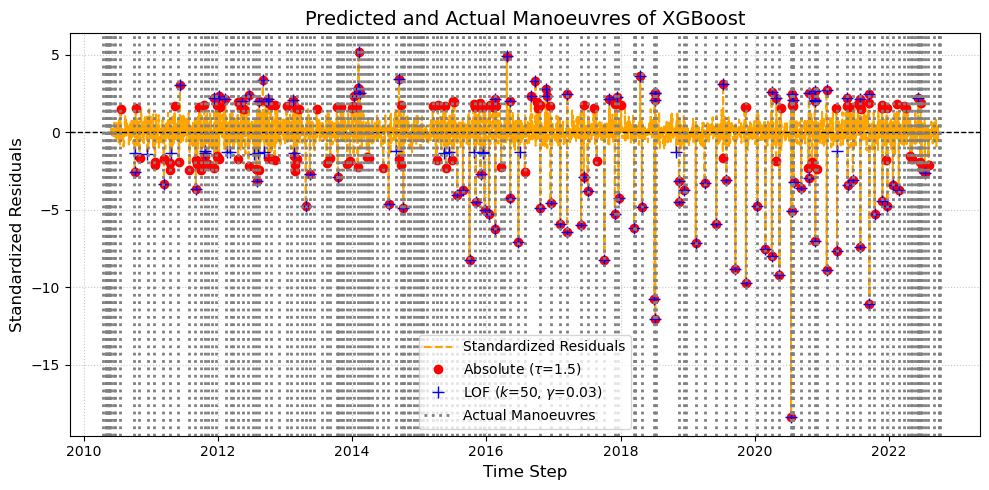

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


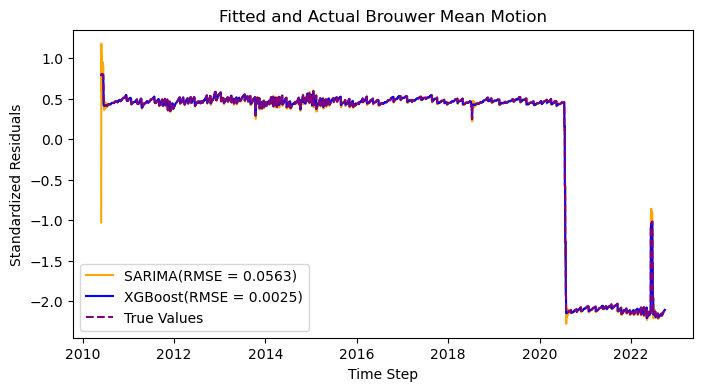

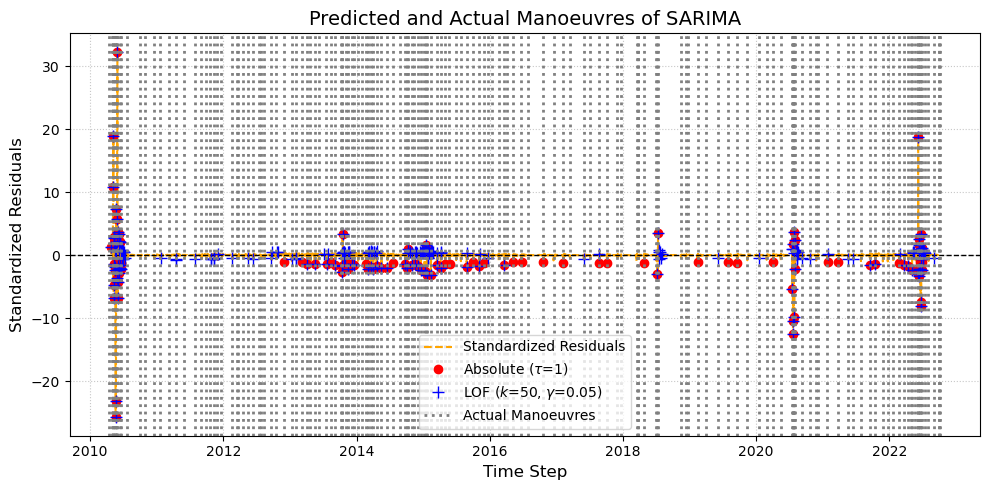

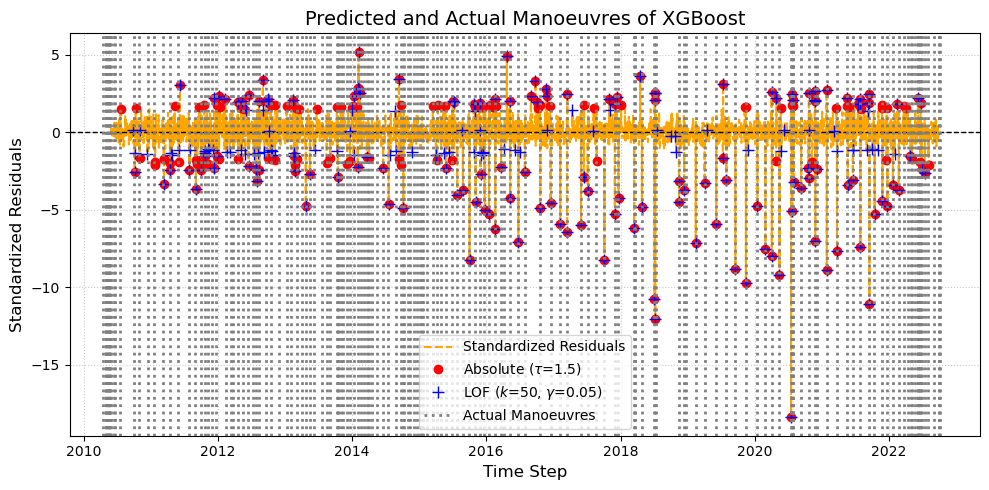

---------------------------------------------------------------------------------------------------------------------------------------------





In [10]:
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['CRYO2']
for k, gamma in grid:
    print(f"-------------------------------------------------------------------------------------------------------------------------------------------")
    hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, SARIMA_threshold=1, XGBoost_threshold=1.5, n_neighbors=k, contamination=gamma)
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

-------------------------------------------------------------------------------------------------------------------------------------------


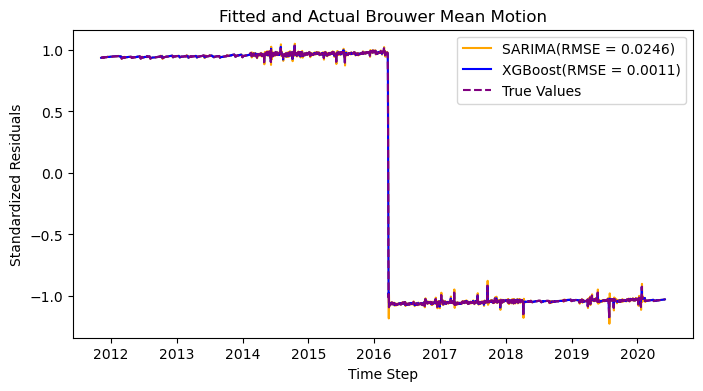

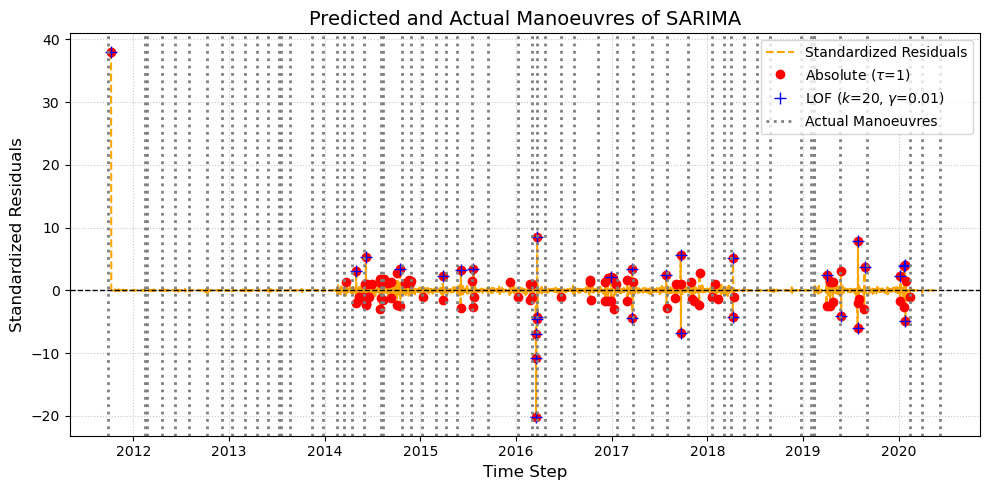

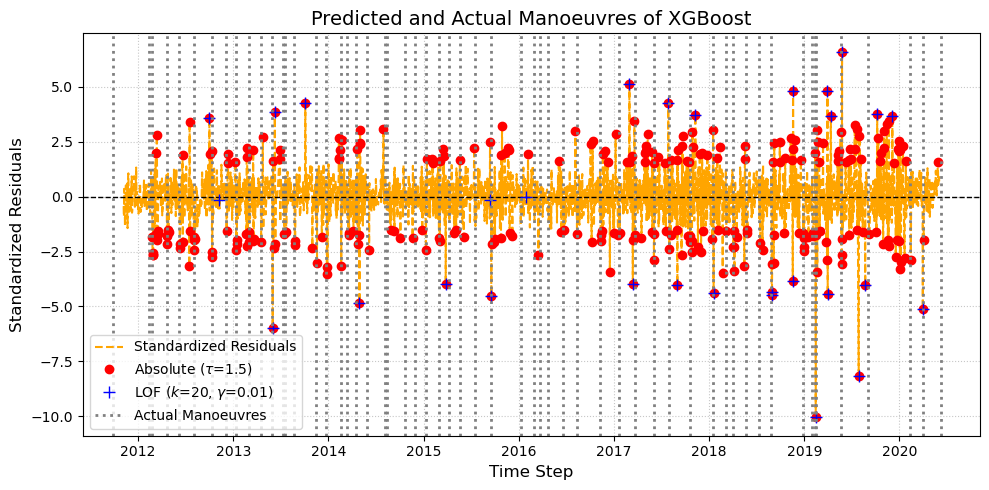

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


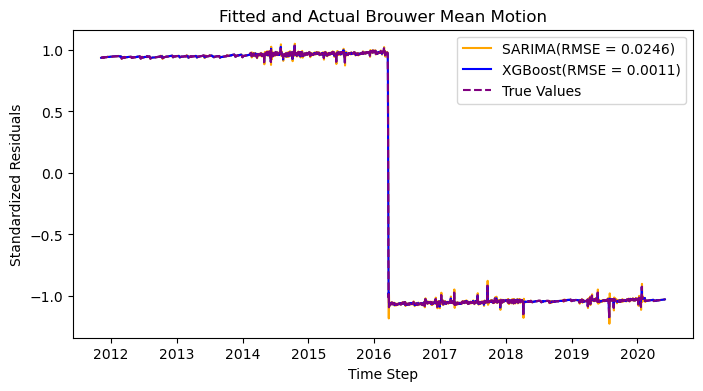

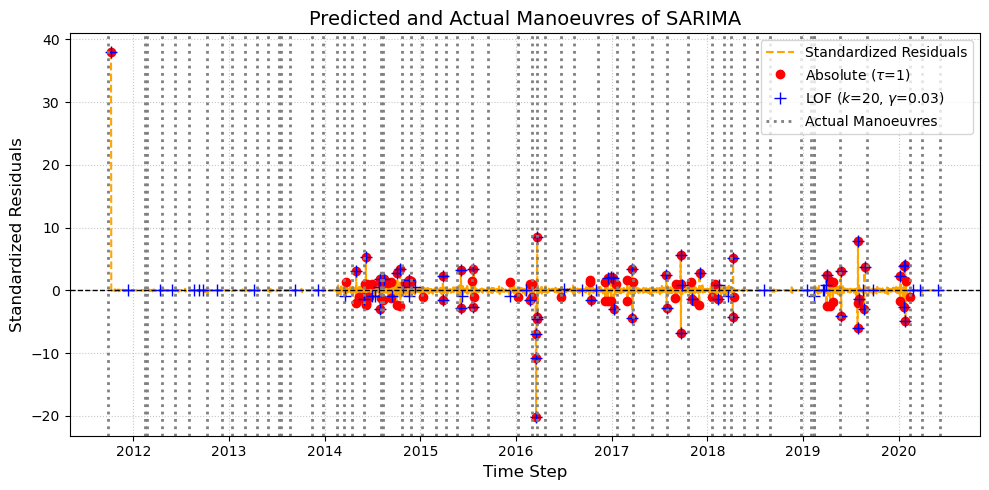

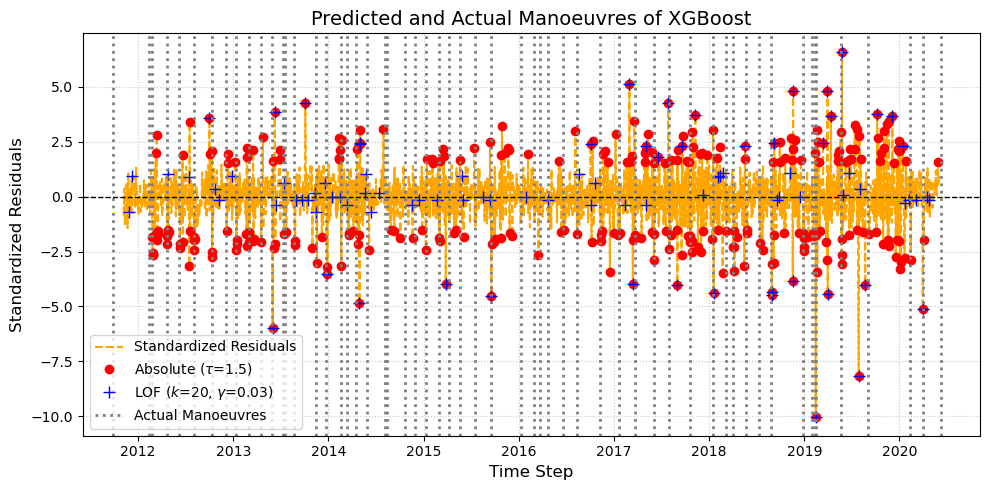

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


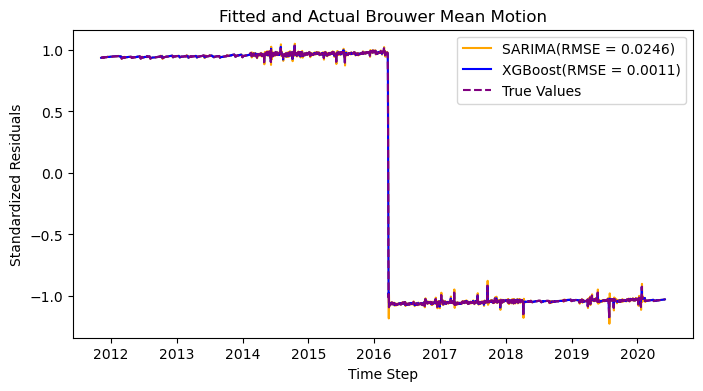

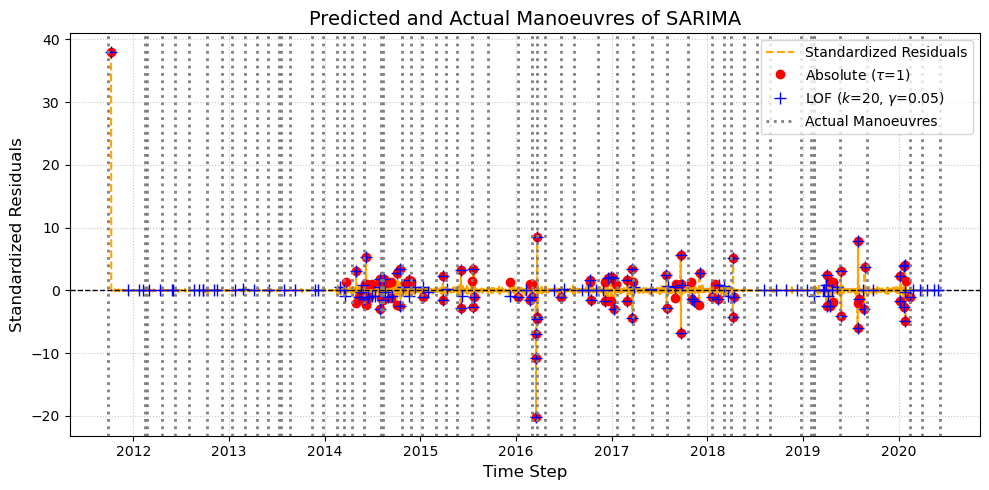

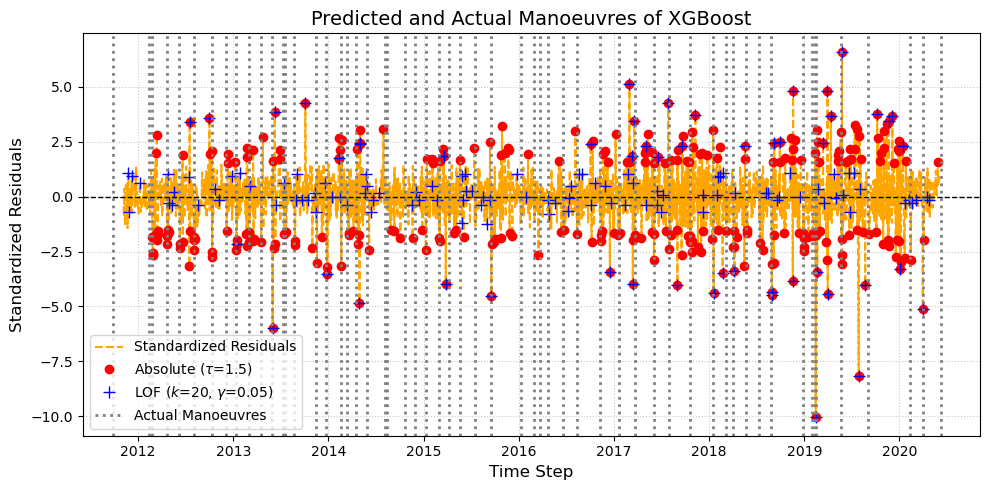

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


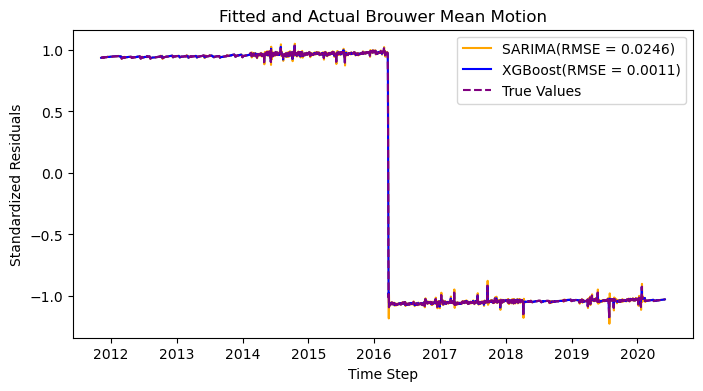

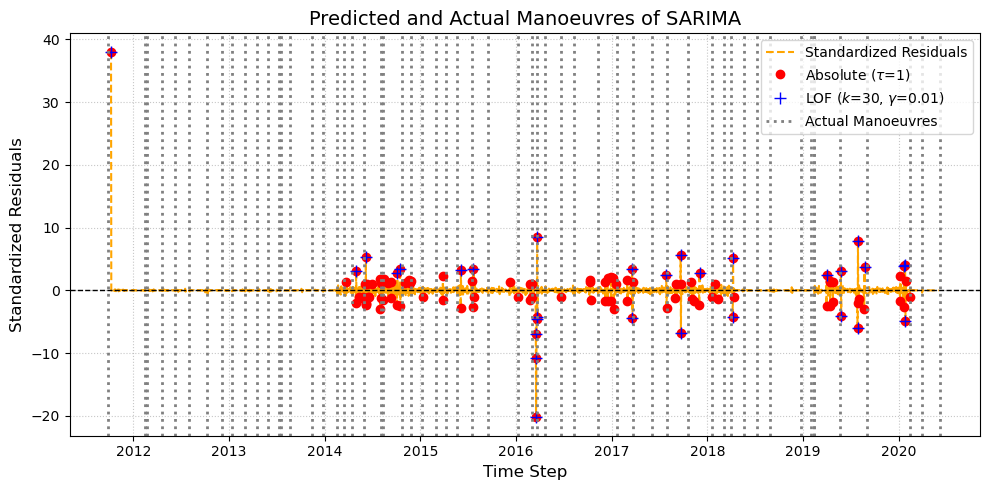

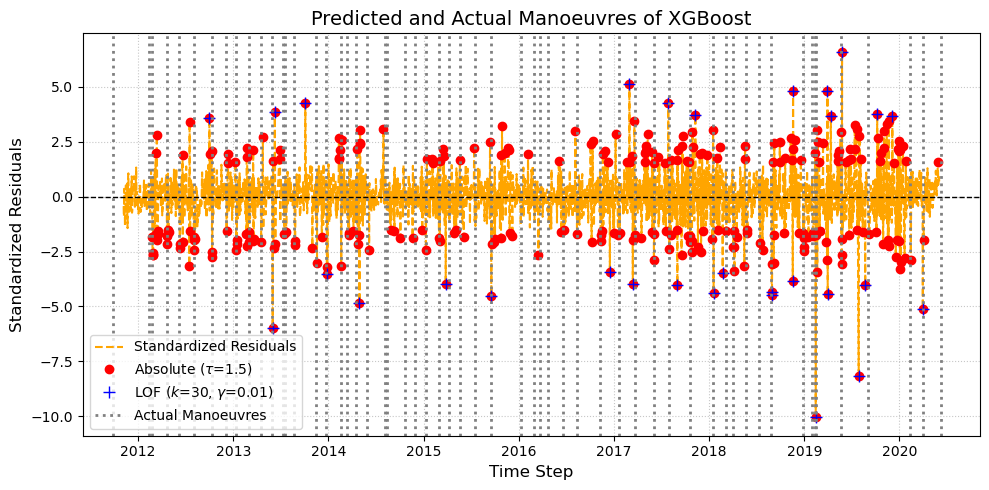

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


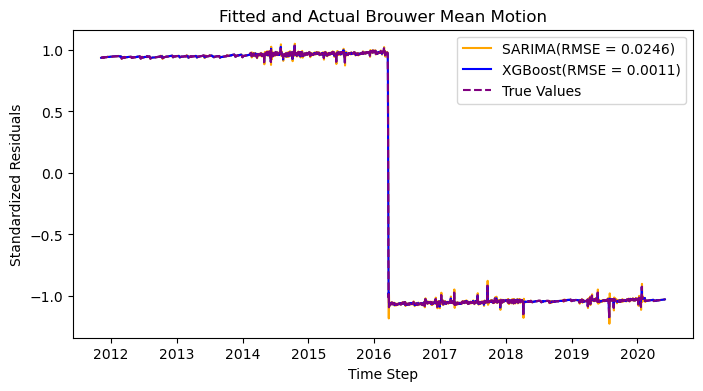

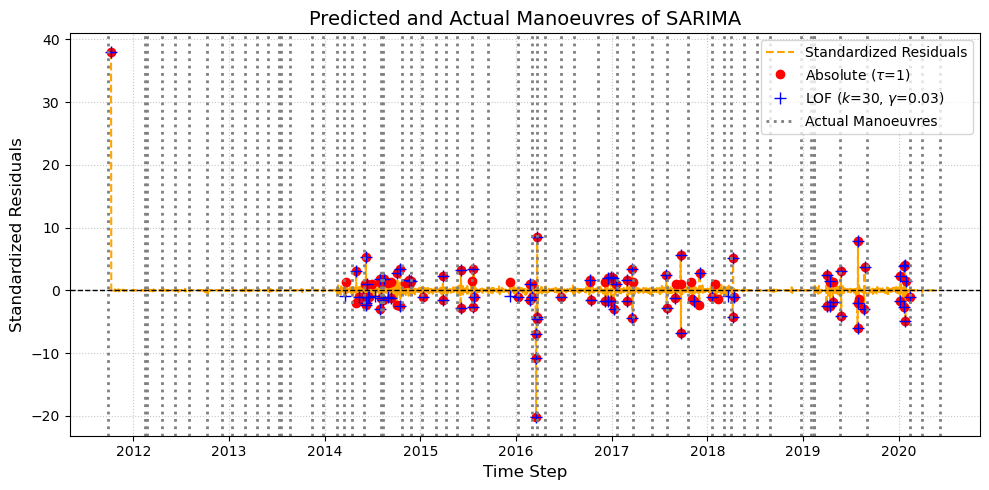

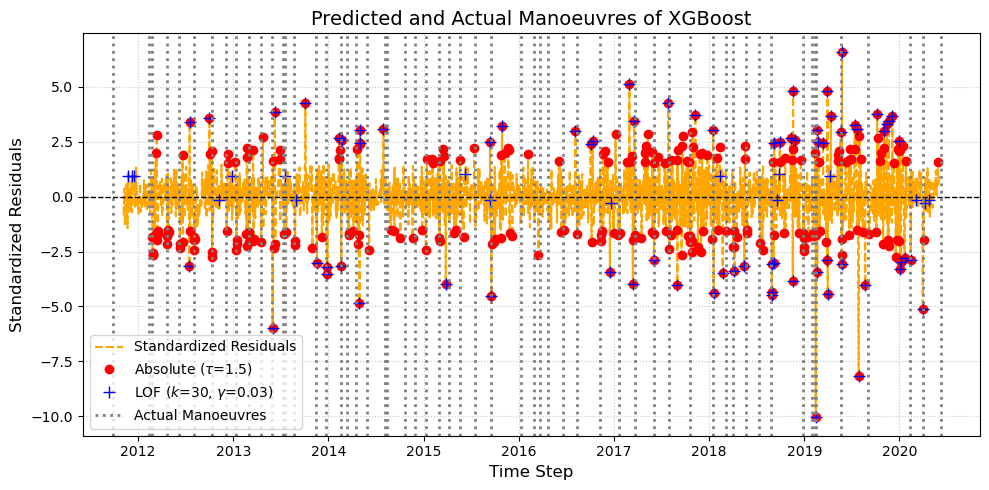

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


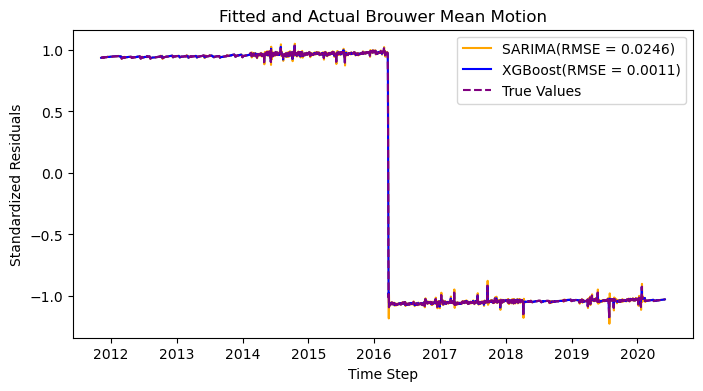

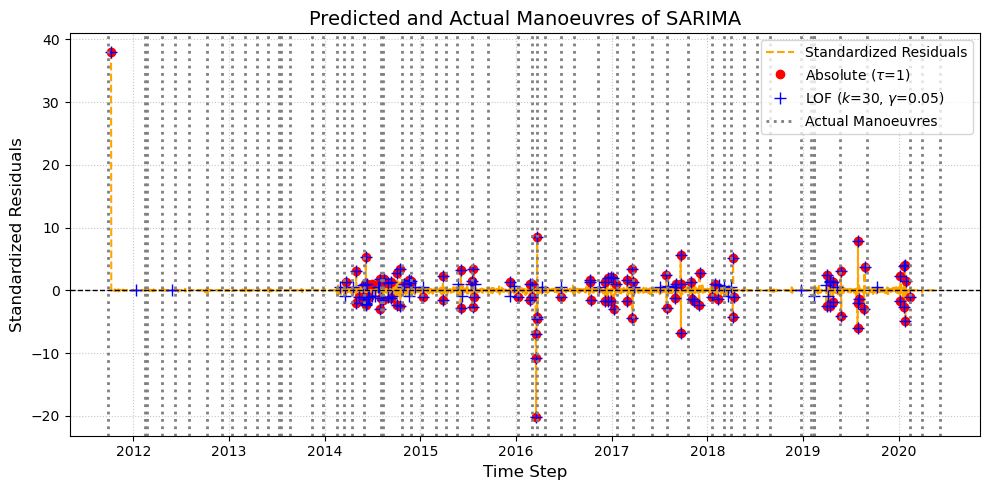

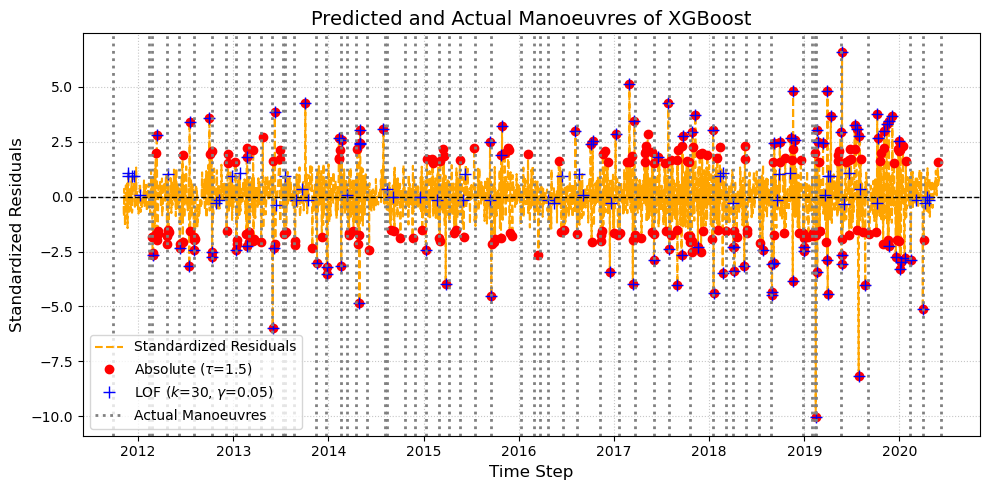

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


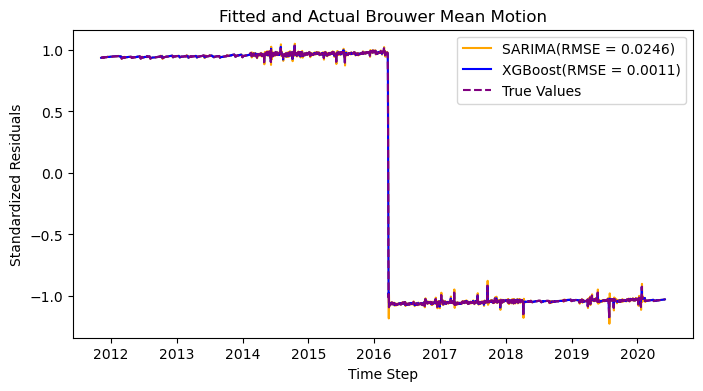

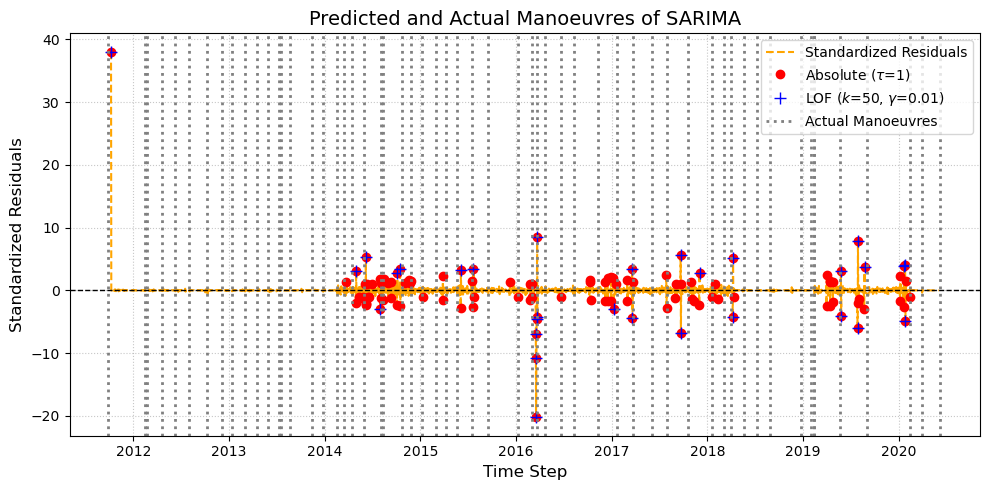

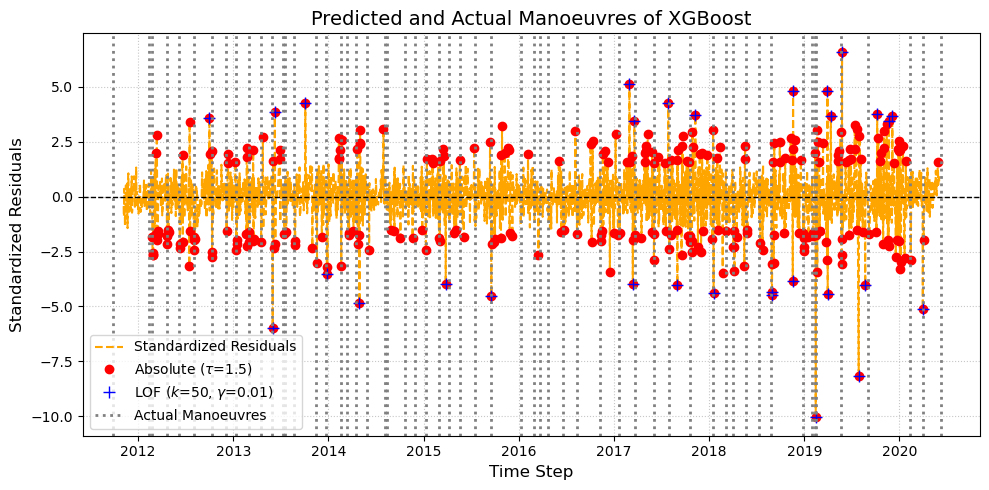

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


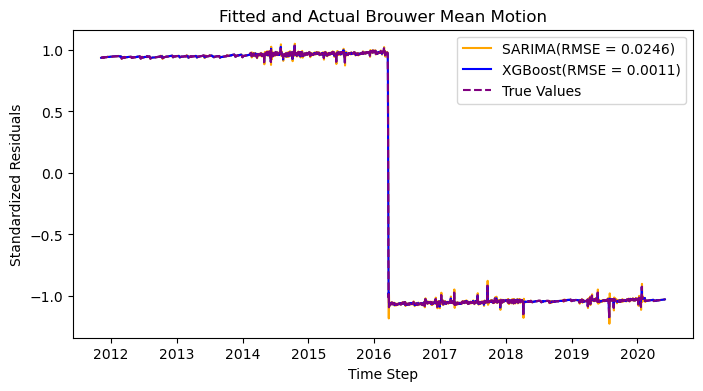

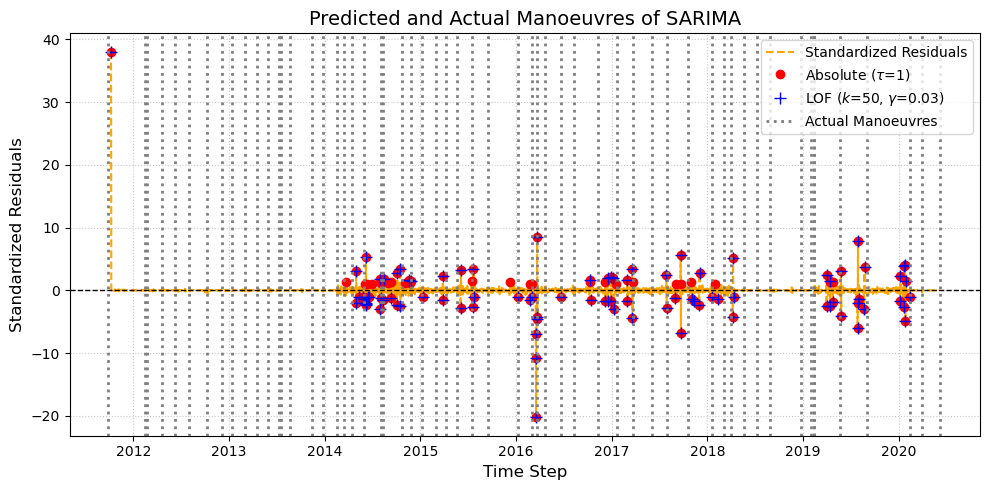

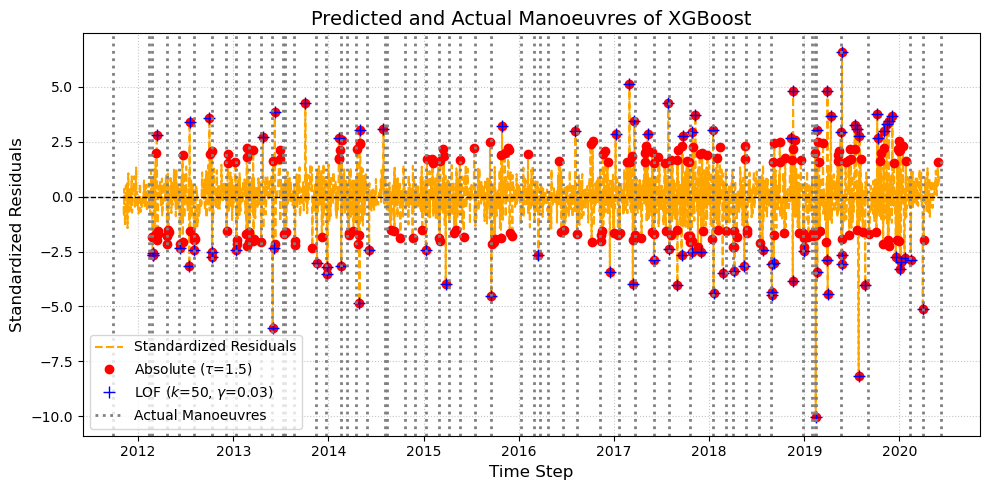

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


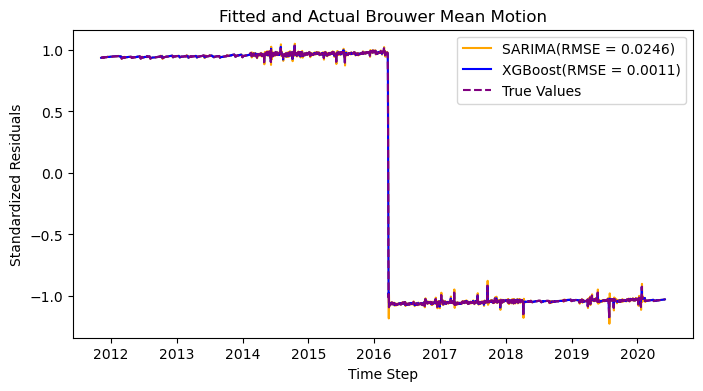

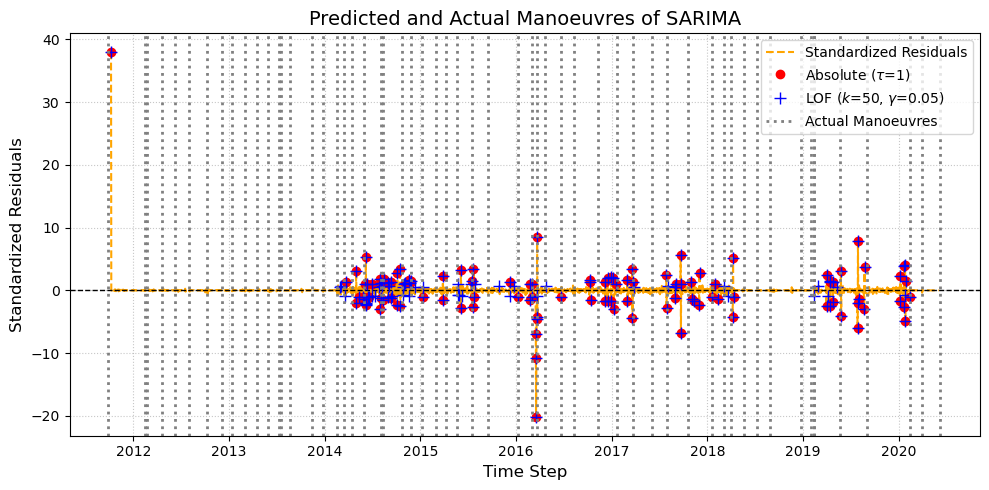

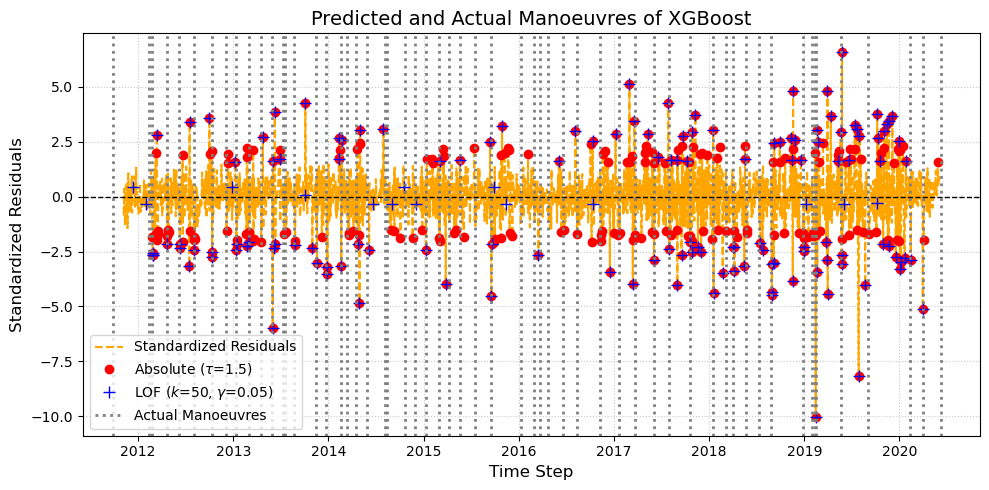

---------------------------------------------------------------------------------------------------------------------------------------------





In [11]:
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['HY-2A']
for k, gamma in grid:
    print(f"-------------------------------------------------------------------------------------------------------------------------------------------")
    hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, SARIMA_threshold=1, XGBoost_threshold=1.5, n_neighbors=k, contamination=gamma)
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

-------------------------------------------------------------------------------------------------------------------------------------------


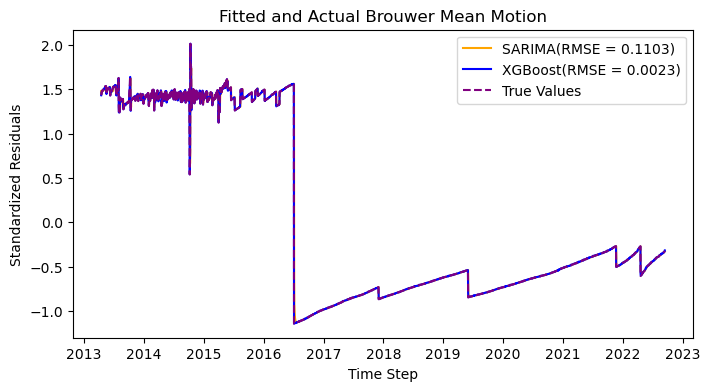

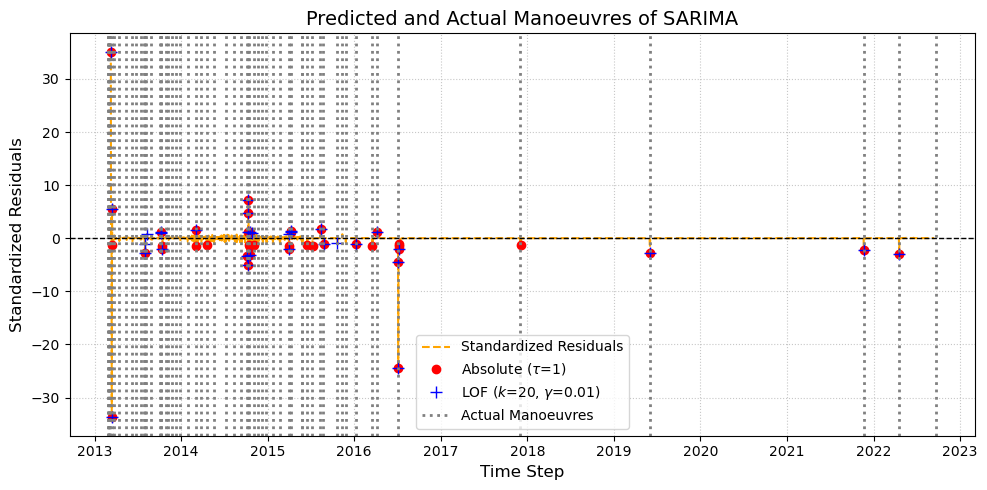

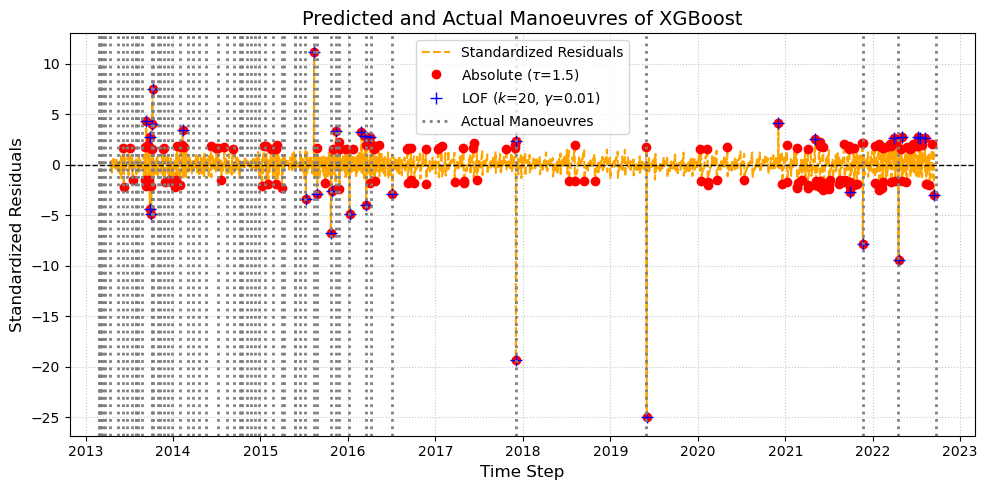

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


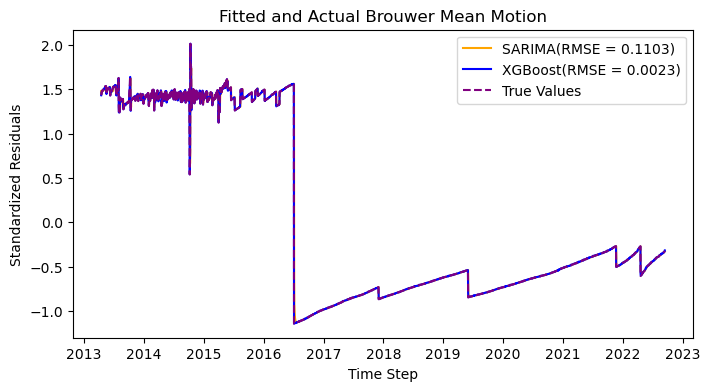

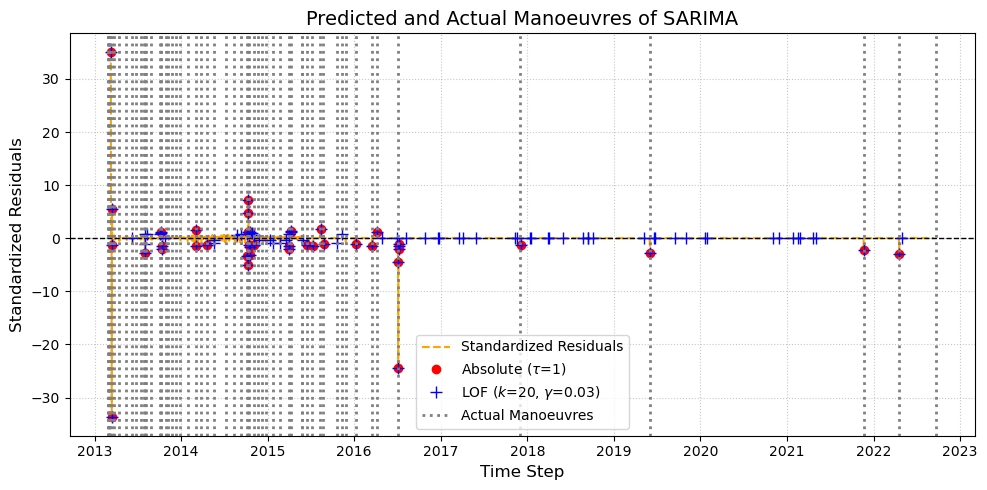

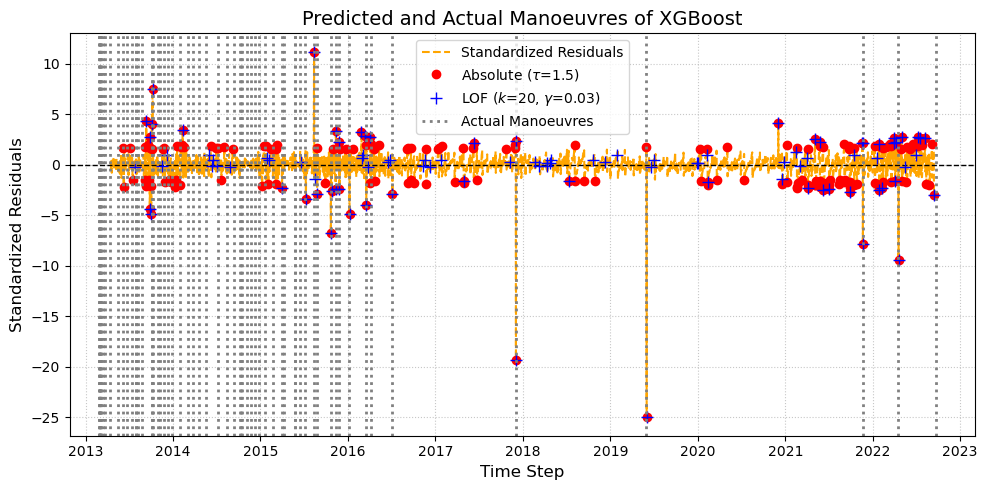

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


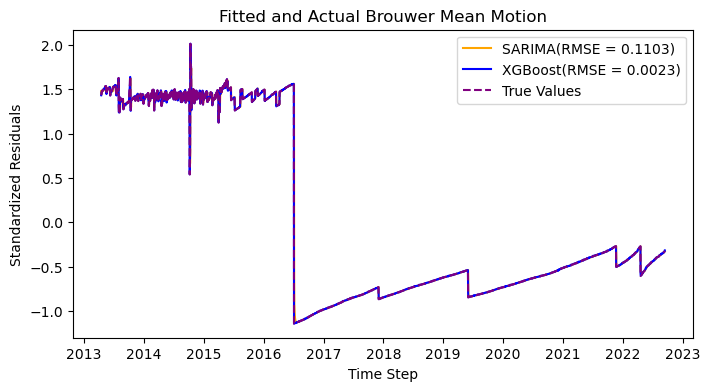

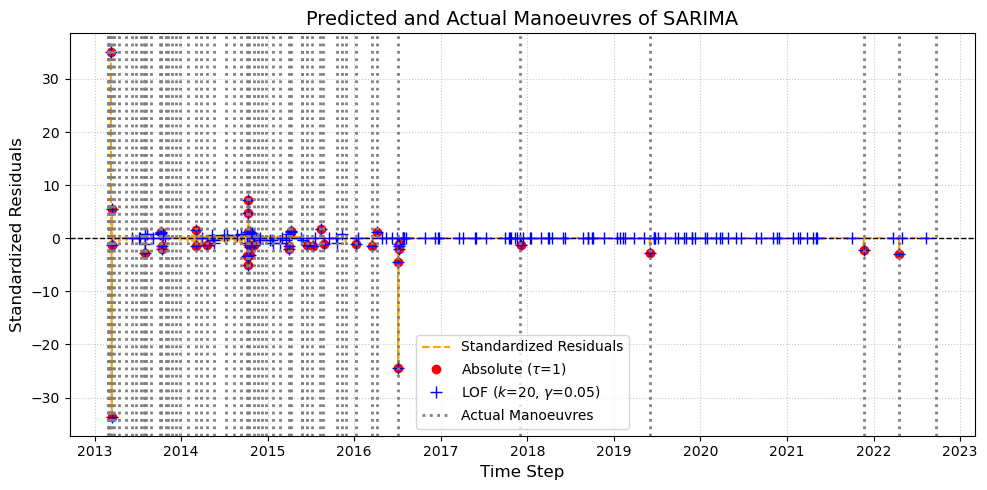

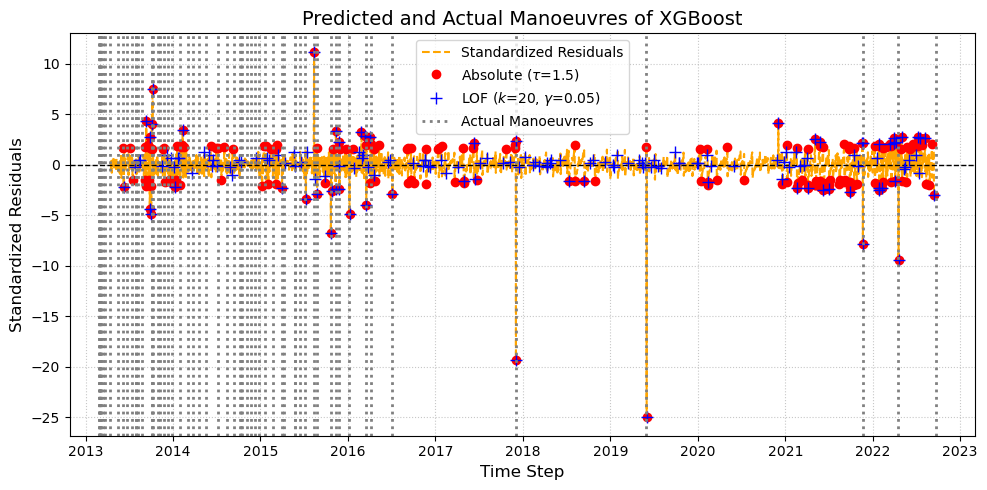

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


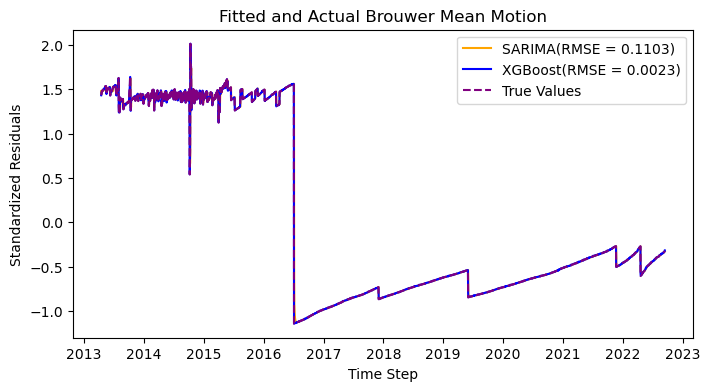

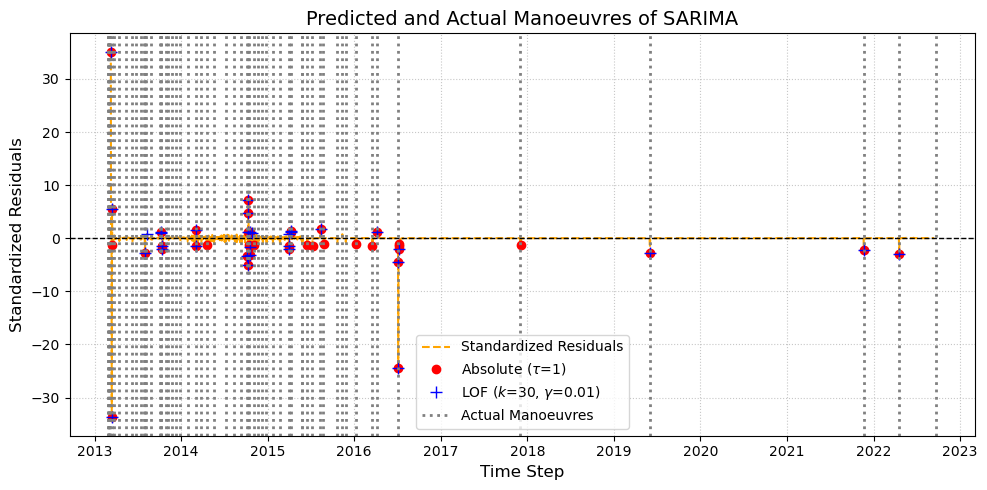

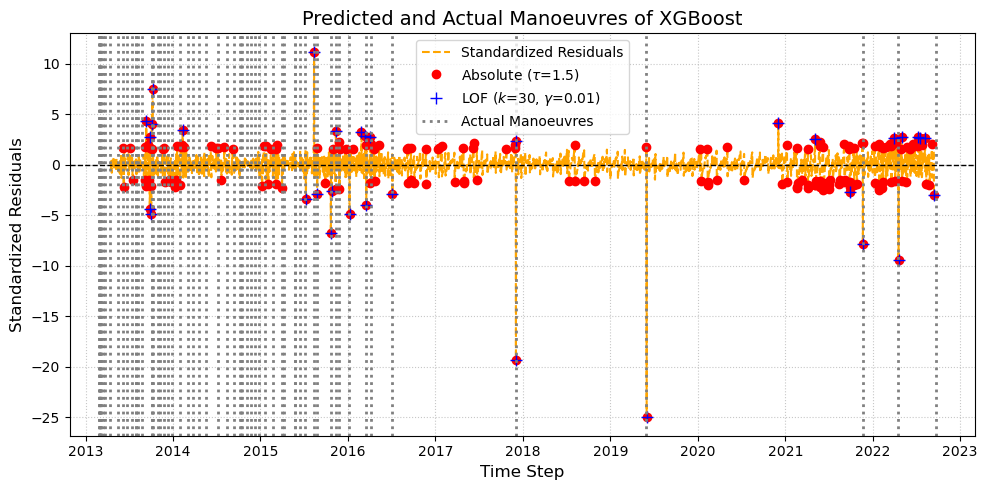

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


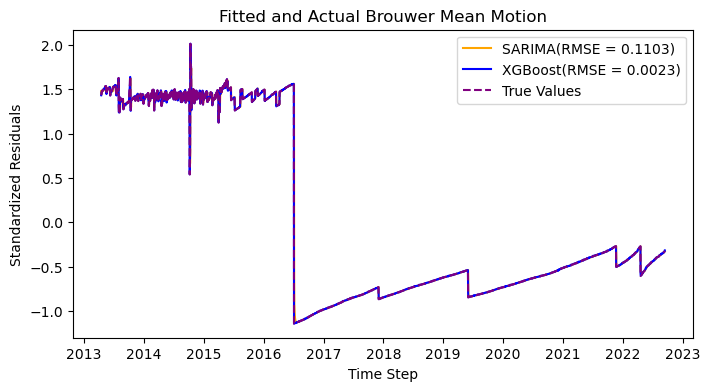

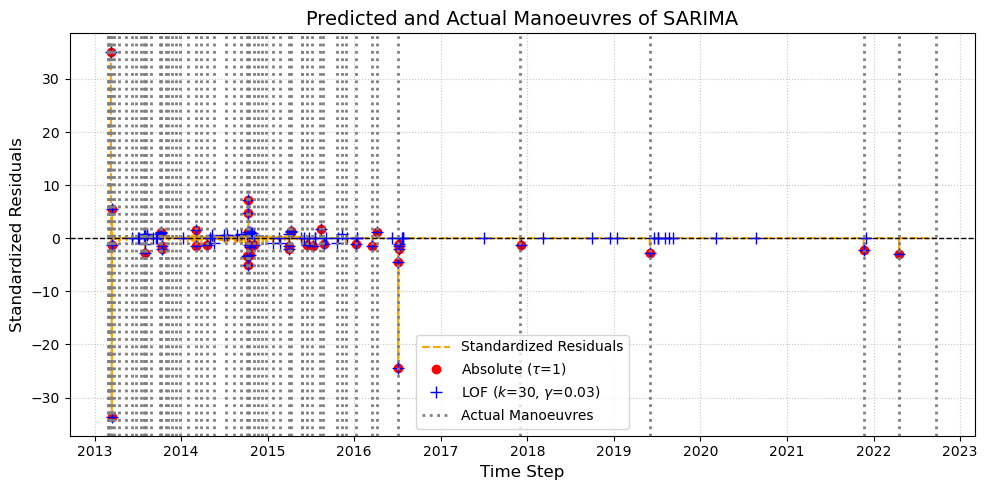

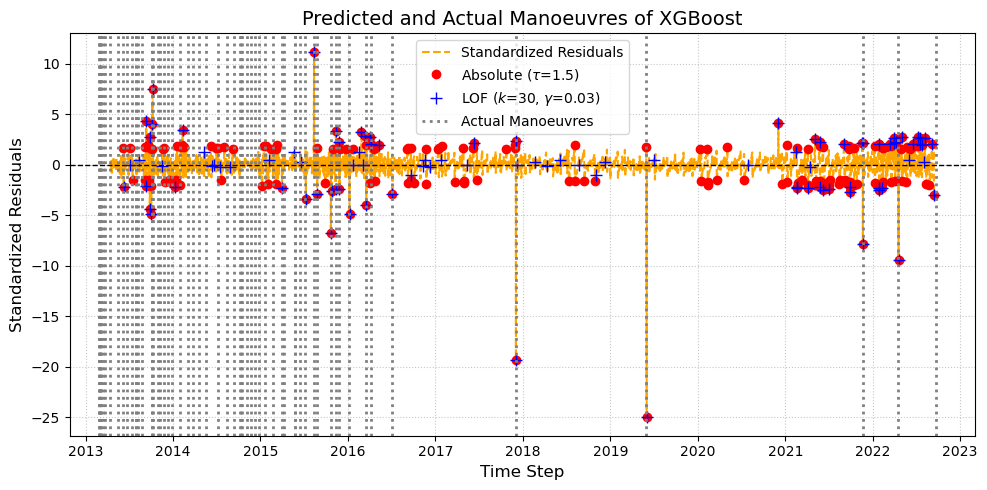

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


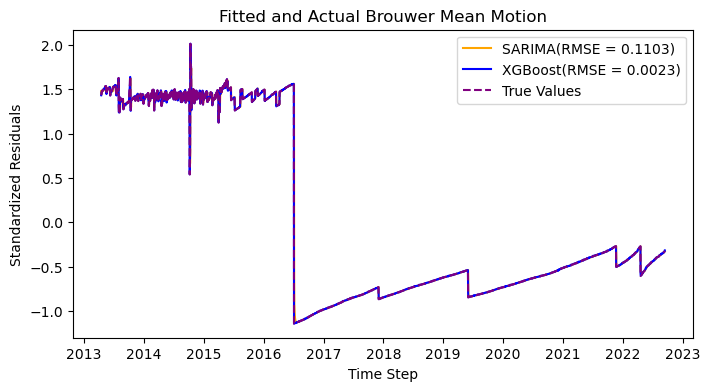

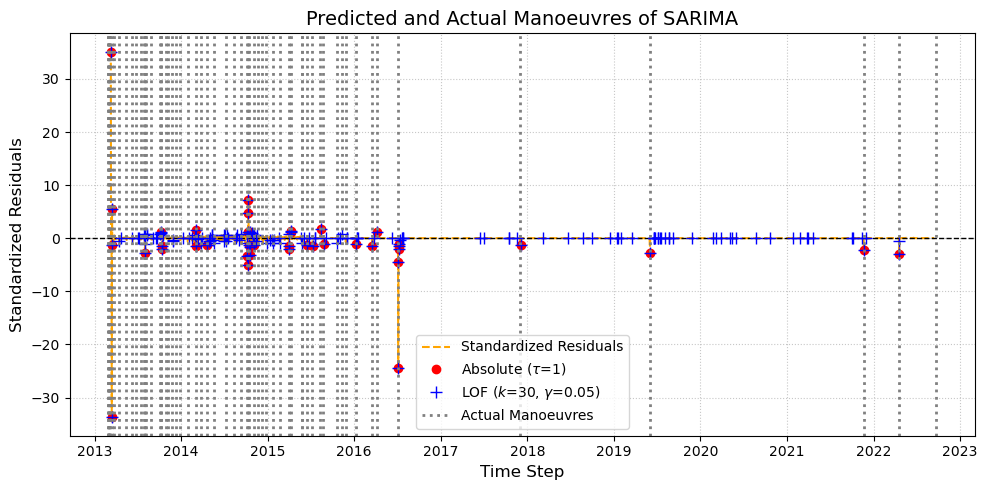

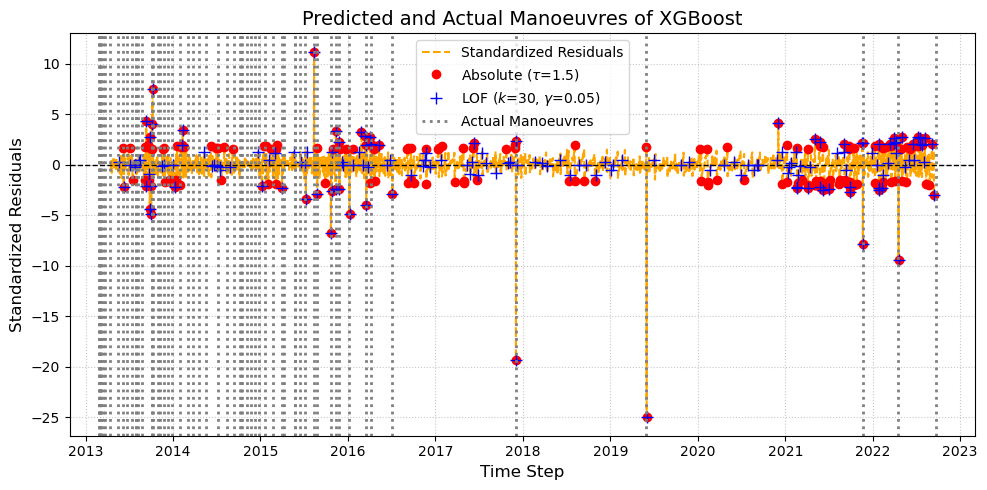

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


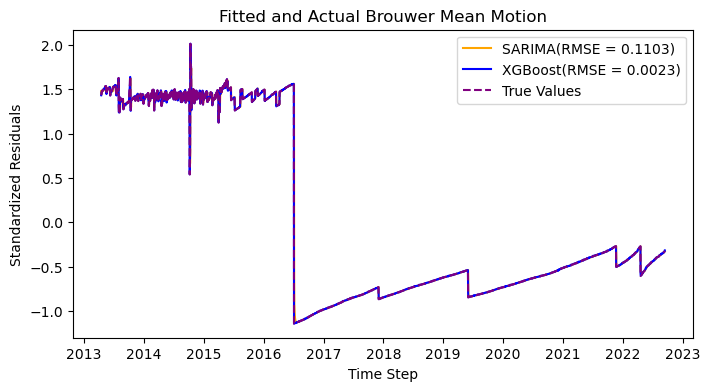

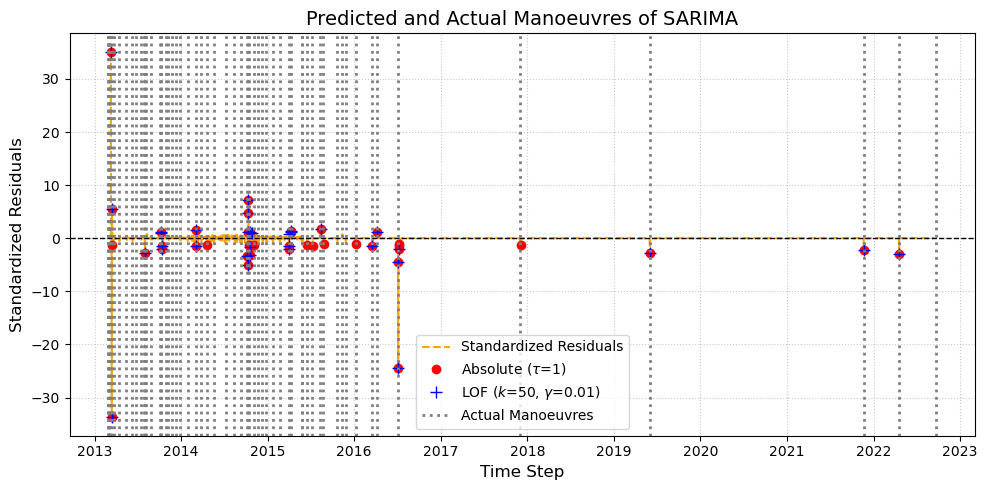

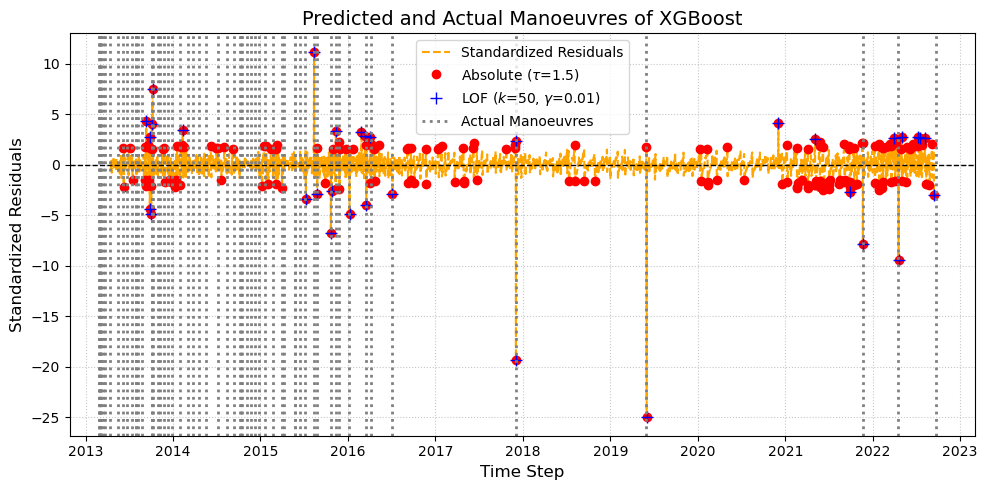

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


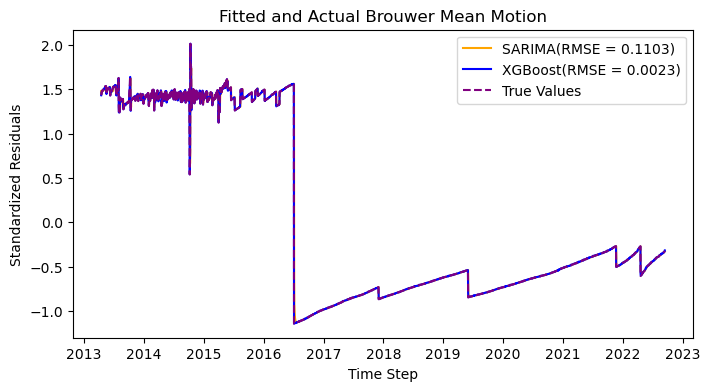

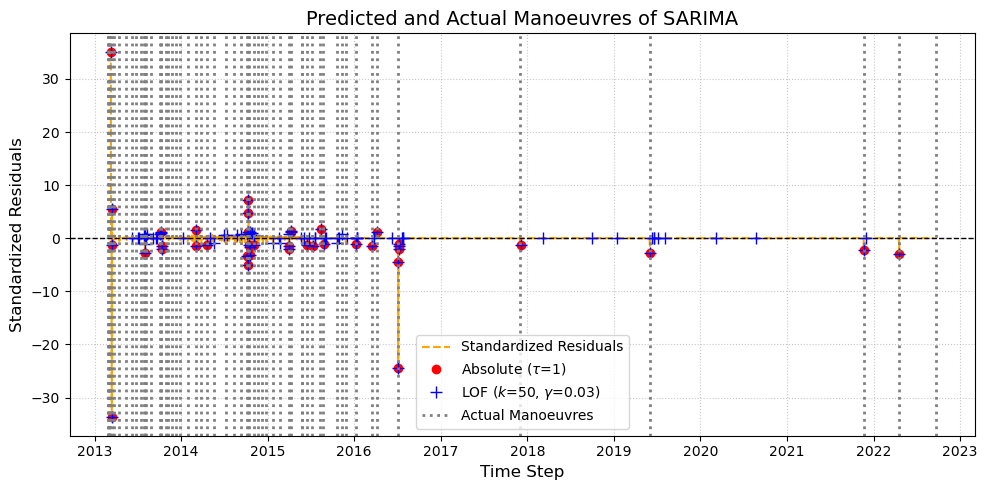

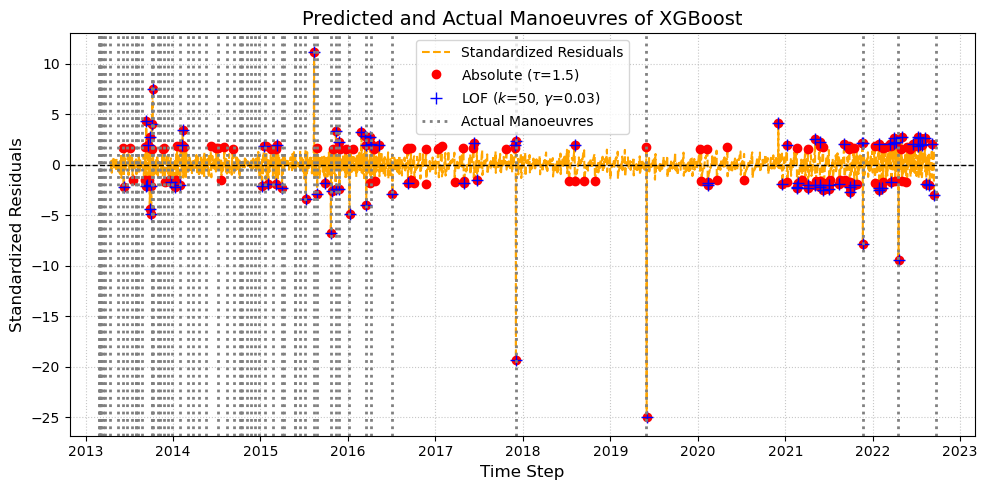

---------------------------------------------------------------------------------------------------------------------------------------------



-------------------------------------------------------------------------------------------------------------------------------------------


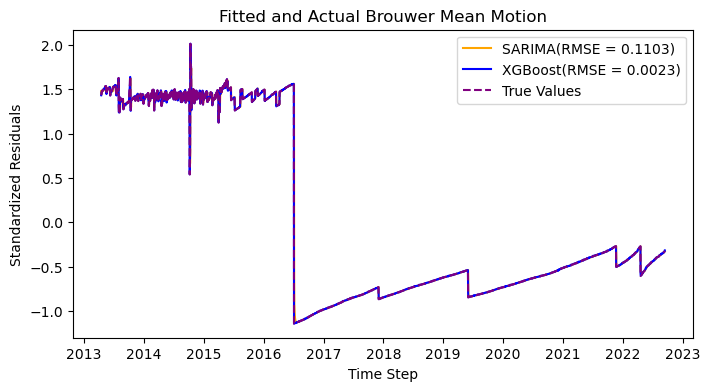

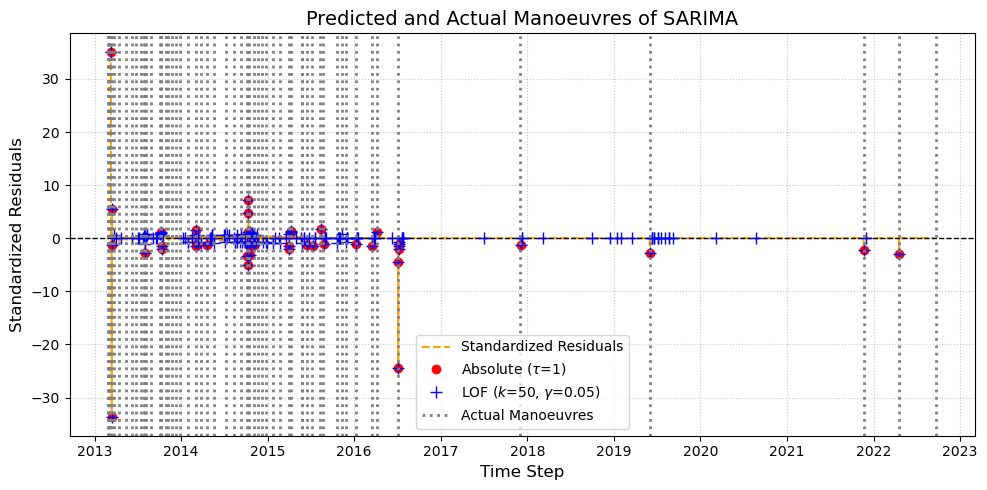

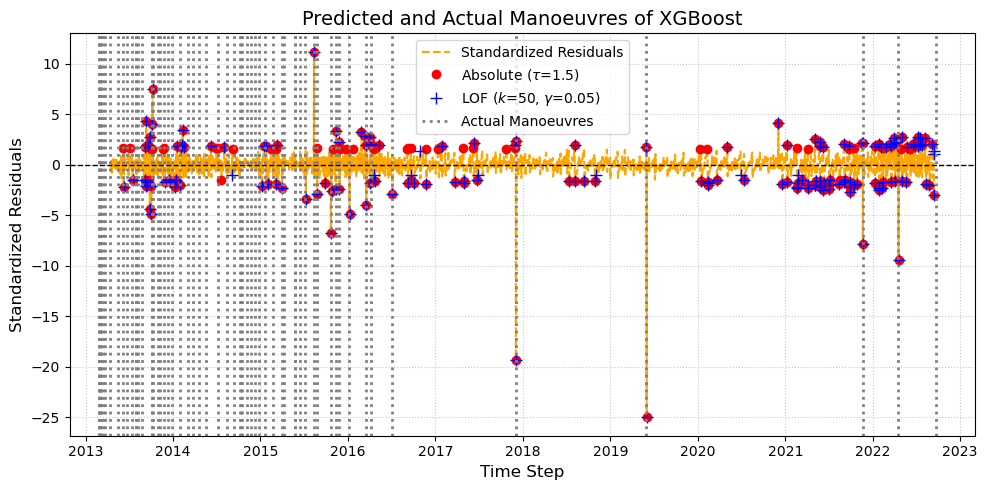

---------------------------------------------------------------------------------------------------------------------------------------------





In [12]:
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['SARAL']
for k, gamma in grid:
    print(f"-------------------------------------------------------------------------------------------------------------------------------------------")
    hypter_tune(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, SARIMA_threshold=1, XGBoost_threshold=1.5, n_neighbors=k, contamination=gamma)
    print("---------------------------------------------------------------------------------------------------------------------------------------------")
    print()
    print()
    print()

# Results

In [13]:
def plot_final_res(satelllite_name, model_name, stdres, abs_pred_man, LOF_pred_man, abs_threshold, n_neighbors, contamination,
                   start_date=None, end_date=None):
    plt.figure(figsize=(12, 5))
    
    # Filter by time range if specified
    if start_date and end_date:
        stdres = stdres.loc[start_date:end_date]
        abs_pred_man = abs_pred_man.loc[start_date:end_date]
        LOF_pred_man = LOF_pred_man.loc[start_date:end_date]
    
    # Plot standardized residuals
    plt.plot(stdres, linestyle='dashed', color='orange', label="Standardized Residuals")
    
    # Draw horizontal reference line at 0
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    
    # Outliers detected by absolute threshold
    plt.plot(abs_pred_man.index, abs_pred_man.values, 
             marker='o', markersize=6, color='red', linestyle="None",
             label=f"Absolute ($\\tau$={abs_threshold})")
    
    # Outliers detected by LOF
    plt.plot(LOF_pred_man.index, LOF_pred_man.values, 
             marker='+', markersize=8, color='blue', linestyle="None",
             label=f"LOF ($k$={n_neighbors}, $\\gamma$={contamination})")
    
    # Actual manoeuvre dates
    for i, date in enumerate(satellite.df_man['manoeuvre_date']):
        # Only plot manoeuvres within the start_date ~ end_date range
        if (not start_date or date >= pd.to_datetime(start_date).date()) and \
           (not end_date or date <= pd.to_datetime(end_date).date()):
            if i == 0:
                plt.axvline(x=date, color='gray', linestyle='dotted', linewidth=2, label="Actual Manoeuvres")
            else:
                plt.axvline(x=date, color='gray', linestyle='dotted', linewidth=2)
    
    # Basic plot settings
    plt.title(f"Predicted and Actual Manoeuvres of {satelllite_name} - {model_name}", fontsize=14)
    plt.xlabel("", fontsize=14)
    plt.ylabel("Standardized Residuals", fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True, linestyle=':', linewidth=0.8, alpha=0.7)
    plt.legend(fontsize=14)
    plt.tight_layout()
    plt.show()


def final_run(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = True, 
                   n_lag = 30, 
                   SARIMA_threshold=2, SRIMA_n_neighbors=30, SARIMA_contamination=0.05,
                   XGBoost_threshold=2, XGB_n_neighbors=30, XGB_contamination=0.05):
    # Fit XGBoost model
    _, XGB_true, XGB_fit = train_XGB(satellite, n_lag)
    XGB_residual = get_residual(XGB_true, XGB_fit, residual_decomposed = XGB_decomp, plt_show=False)

    # Calculate RMSE
    XGB_rmse = round(np.sqrt(mean_squared_error(XGB_true, XGB_fit)),4)

    # Align index for plotting
    common_index = XGB_fit.index.intersection(SARIMA_fit.index)
    SARIMA_fit = SARIMA_fit.reindex(common_index)
    
    # Plot fitted vs actual Brouwer mean motion
    plt.figure(figsize=(8, 4))
    plt.plot(SARIMA_fit, label=f"SARIMA(RMSE = {SARIMA_rmse})", color='orange', linestyle='solid')
    plt.plot(XGB_fit, label=f"XGBoost(RMSE = {XGB_rmse})", color='blue', linestyle='solid')
    plt.plot(XGB_true, label="True Values", color='purple', linestyle='dashed')
    
    plt.title(f"Fitted and Actual Brouwer Mean Motion {satellite.name}")
    plt.xlabel("")
    plt.ylabel("Scaled Brouwer Mean Motion")
    plt.ylabel("Standardized Residuals")
    plt.legend()
    plt.show() 

    # Detect SARIMA outliers
    SARIMA_abs_stdres, SARIMA_abs_pred_man = outlier_absolute(SARIMA_residual, SARIMA_threshold)
    _, SARIMA_LOF_pred_man = outlier_LOF(SARIMA_residual, SRIMA_n_neighbors, SARIMA_contamination)
    # Plot SARIMA results
    plot_final_res(satellite.name, "ARIMA", SARIMA_abs_stdres, SARIMA_abs_pred_man, SARIMA_LOF_pred_man, SARIMA_threshold, SRIMA_n_neighbors, SARIMA_contamination)
    
    # Detect XGBoost outliers
    XGB_abs_stdres, XGB_abs_pred_man = outlier_absolute(XGB_residual, XGBoost_threshold)
    _, XGB_LOF_pred_man = outlier_LOF(XGB_residual, XGB_n_neighbors, XGB_contamination)
    # Plot XGBoost results
    plot_final_res(satellite.name, "XGBoost", XGB_abs_stdres, XGB_abs_pred_man, XGB_LOF_pred_man, XGBoost_threshold, XGB_n_neighbors, XGB_contamination)

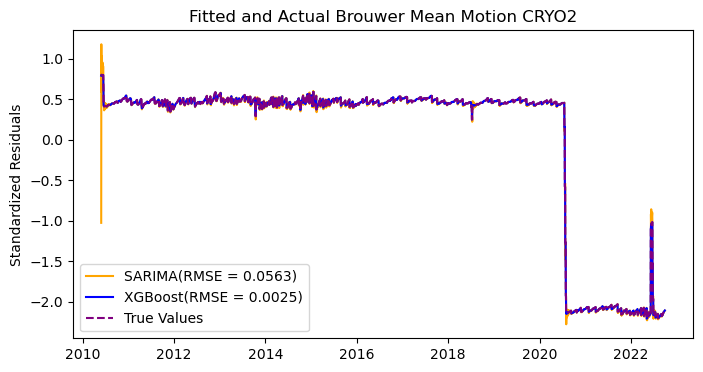

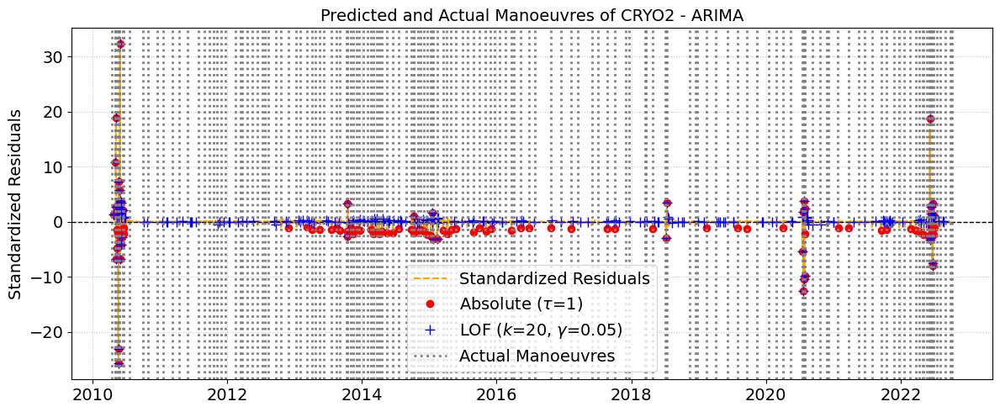

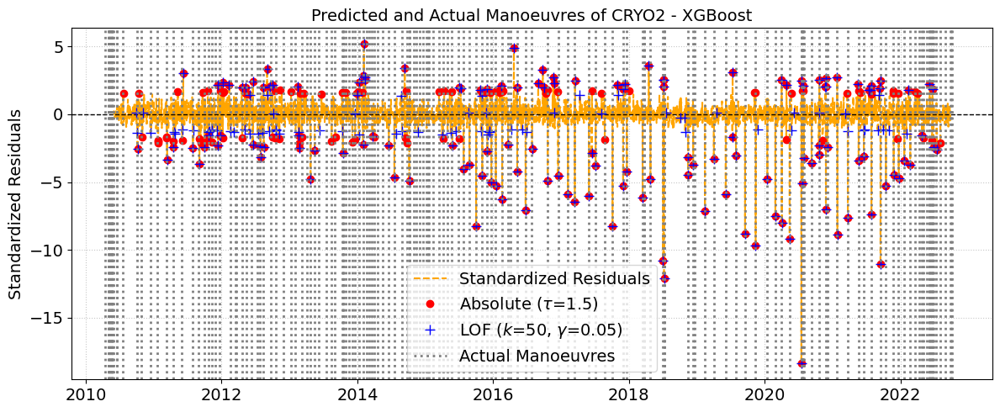

In [14]:
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['CRYO2']
final_run(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, 
                   SARIMA_threshold=1, SRIMA_n_neighbors=20, SARIMA_contamination=0.05,
                   XGBoost_threshold=1.5, XGB_n_neighbors=50, XGB_contamination=0.05)

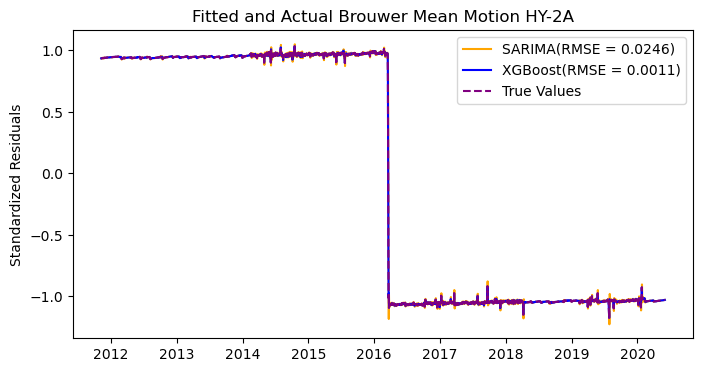

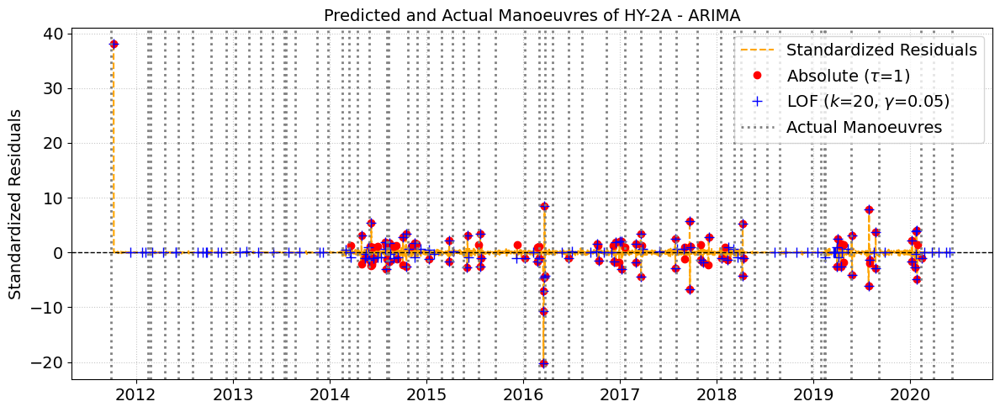

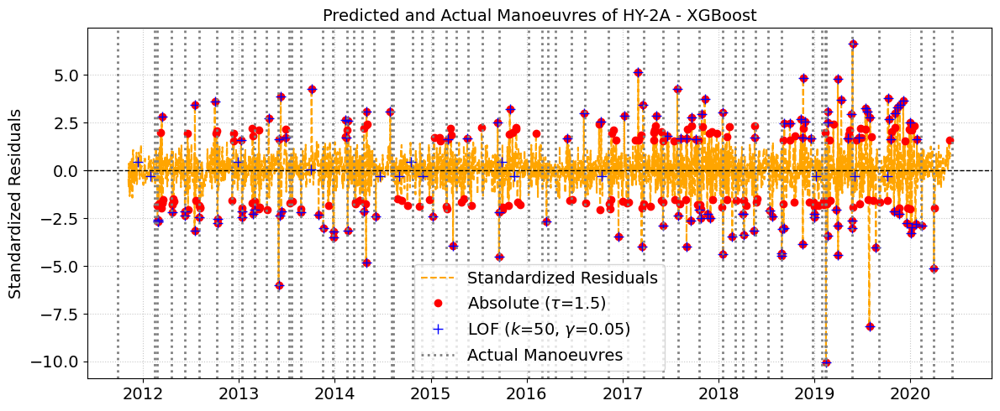

In [15]:
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['HY-2A']
final_run(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, 
                   SARIMA_threshold=1, SRIMA_n_neighbors=20, SARIMA_contamination=0.05,
                   XGBoost_threshold=1.5, XGB_n_neighbors=50, XGB_contamination=0.05)

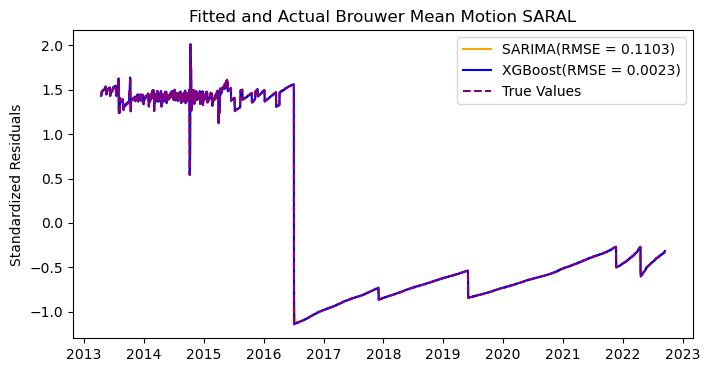

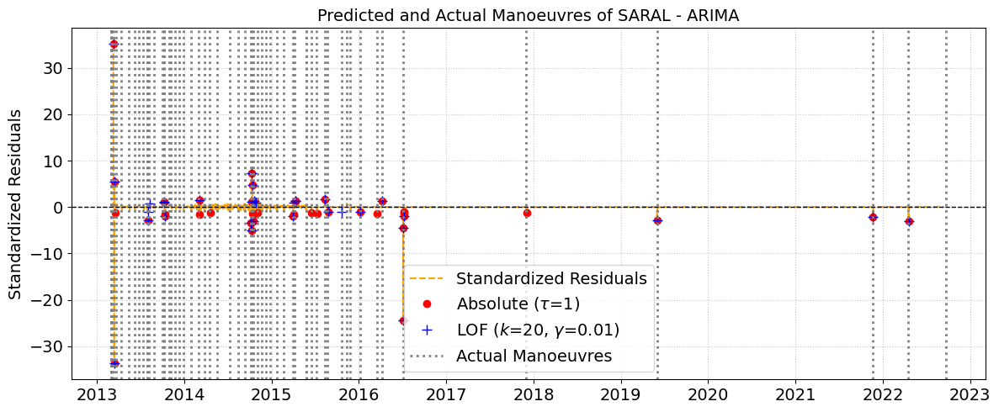

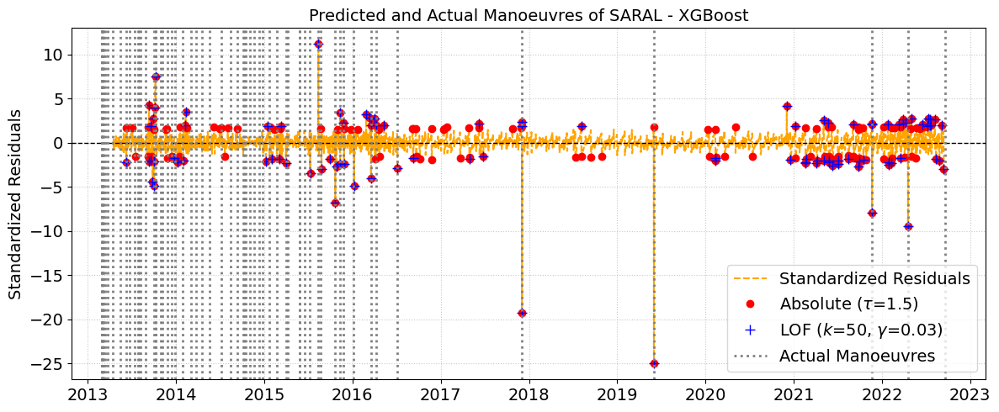

In [16]:
satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse = satellites['SARAL']    
final_run(satellite, SARIMA_true, SARIMA_fit, SARIMA_residual, SARIMA_rmse, XGB_decomp = False, 
                   n_lag = 30, 
                   SARIMA_threshold=1, SRIMA_n_neighbors=20, SARIMA_contamination=0.01,
                   XGBoost_threshold=1.5, XGB_n_neighbors=50, XGB_contamination=0.03)